In [244]:
from time import perf_counter

In [245]:
t1 = perf_counter()

In [246]:
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

# Add parent directory to path
sys.path.append("..")

# Set style
plt.style.use("seaborn-v0_8-whitegrid")
%matplotlib inline

print(f"Numpy version: {np.__version__}")
print(f"Pandas version: {pd.__version__}")
print(f"Seaborn version: {sns.__version__}")

Numpy version: 2.5.1
Pandas version: 3.0.3
Seaborn version: 0.13.2


# Helper functions

## Memory Optimization

In [247]:
from src.utils.preprocessing import (
    load_breast_cancer_data,
    load_adult_income_data,
    load_covertype_data,
    load_mnist_data,
)

## Dataset loading functions

## Plotting functions

In [248]:
from src.utils.eda_helpers import (
    print_dataset_summary,
    find_outliers,
    DimensionalityReducer,
    plot_all_histograms,
    plot_boxplots,
    plot_correlation_heatmap,
    plot_kde_grid,
    plot_pairplot,
    get_box_dist_plot,
)

## Loading datasets

In [249]:
# 1. Breast Cancer
X_bc, y_bc, df_bc = load_breast_cancer_data(optimize_memory=True, verbose=True)

# 2. Adult Income
X_adult, y_adult, df_adult = load_adult_income_data(
    drop_categorical=True, optimize_memory=True, verbose=True
)

# 3. Covertype
X_cover, y_cover, df_cover = load_covertype_data(
    drop_categorical=True, optimize_memory=True, verbose=True
)

# 4. MNIST
X_mnist, y_mnist, df_mnist = load_mnist_data(
    optimize_memory=True, verbose=True, return_numpy=False
)

Loaded from Parquet: c:\Users\Bayram\Desktop\experiments_ml_project\data\breast_cancer.parquet
Loaded from Parquet: c:\Users\Bayram\Desktop\experiments_ml_project\data\adult_income.parquet
Loaded from Parquet: c:\Users\Bayram\Desktop\experiments_ml_project\data\covertype.parquet
Loaded from Parquet: c:\Users\Bayram\Desktop\experiments_ml_project\data\mnist.parquet
MNIST pre-optimization: 419.24 MB
MNIST post-optimization: 52.87 MB
Memory reduction: 87.4%


In [250]:
print_dataset_summary(
    X_bc,
    X_adult,
    X_cover,
    X_mnist,
    y_bc,
    y_adult,
    y_cover,
    y_mnist,
    df_bc,
    df_adult,
    df_cover,
    df_mnist,
)


DATASET SUMMARY
      Dataset  Samples  Features  Classes  Memory (MB)
Breast Cancer      569        30        2     0.135118
 Adult Income    48842         6        2     3.202830
    Covertype   581012        10        7    49.314564
        MNIST    70000       784       10    52.938461


In [251]:
X_bc_cols = X_bc.columns.tolist()
X_adult_cols = X_adult.columns.tolist()
X_cover_cols = X_cover.columns.tolist()
X_mnist_cols = X_mnist.columns.tolist()

# Breast Cancer Wisconsin

In [252]:
X_bc.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.990000,10.380000,122.800003,1001.000000,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.379999,17.330000,184.600006,2019.000000,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.570000,17.770000,132.899994,1326.000000,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.990000,23.410000,158.800003,1956.000000,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.690001,21.250000,130.000000,1203.000000,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.570000,25.530001,152.500000,1709.000000,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.420000,20.379999,77.580002,386.100006,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.910000,26.500000,98.870003,567.700012,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.290001,14.340000,135.100006,1297.000000,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.540001,16.670000,152.199997,1575.000000,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [253]:
y_bc.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int8

In [254]:
X_bc.shape, y_bc.shape

((569, 30), (569,))

In [255]:
X_bc.info()

<class 'pandas.DataFrame'>
Index: 569 entries, 0 to 568
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         569 non-null    f

In [256]:
y_bc.info()

<class 'pandas.Series'>
Index: 569 entries, 0 to 568
Series name: target
Non-Null Count  Dtype
--------------  -----
569 non-null    int8 
dtypes: int8(1)
memory usage: 5.0 KB


In [257]:
X_bc.describe().T

,count,mean,std,min,25%,50%,75%,max
mean radius,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.110001
mean texture,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.799999,39.279999
mean perimeter,569.0,91.969033,24.298981,43.790001,75.169998,86.239998,104.099998,188.500000
mean area,569.0,654.889104,351.914129,143.500000,420.299988,551.099976,782.700012,2501.000000
mean smoothness,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.163400
mean compactness,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.345400
mean concavity,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.426800
mean concave points,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.201200
mean symmetry,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.304000
mean fractal dimension,569.0,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.097440


In [258]:
y_bc.describe().to_frame().T

,count,mean,std,min,25%,50%,75%,max
target,569.0,0.627417,0.483918,0.0,0.0,1.0,1.0,1.0


In [259]:
X_bc.isnull().sum()

mean radius                0
mean texture               0
mean perimeter             0
mean area                  0
mean smoothness            0
mean compactness           0
mean concavity             0
mean concave points        0
mean symmetry              0
mean fractal dimension     0
radius error               0
texture error              0
perimeter error            0
area error                 0
smoothness error           0
compactness error          0
concavity error            0
concave points error       0
symmetry error             0
fractal dimension error    0
worst radius               0
worst texture              0
worst perimeter            0
worst area                 0
worst smoothness           0
worst compactness          0
worst concavity            0
worst concave points       0
worst symmetry             0
worst fractal dimension    0
dtype: int64

In [260]:
y_bc.isnull().sum()

np.int64(0)

In [261]:
X_bc.nunique()

mean radius                456
mean texture               479
mean perimeter             522
mean area                  539
mean smoothness            474
mean compactness           537
mean concavity             537
mean concave points        542
mean symmetry              432
mean fractal dimension     499
radius error               540
texture error              519
perimeter error            533
area error                 528
smoothness error           547
compactness error          541
concavity error            533
concave points error       507
symmetry error             498
fractal dimension error    545
worst radius               457
worst texture              511
worst perimeter            514
worst area                 544
worst smoothness           411
worst compactness          529
worst concavity            539
worst concave points       492
worst symmetry             500
worst fractal dimension    535
dtype: int64

In [262]:
y_bc.nunique()

2

In [263]:
y_bc.value_counts()

target
1    357
0    212
Name: count, dtype: int64

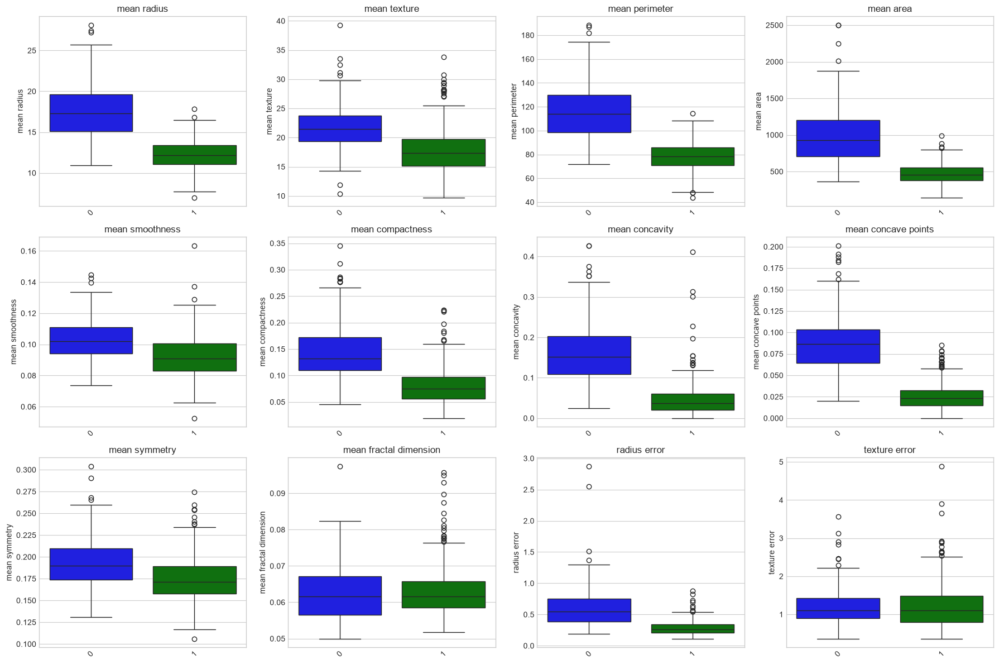

In [264]:
# 1. Breast Cancer - with hue (target)
plot_boxplots(
    df_bc,
    X_bc_cols[:12],
    hue_col="target",
    figsize=(18, 12),
    n_cols=4,
    palette=["blue", "green"],
)

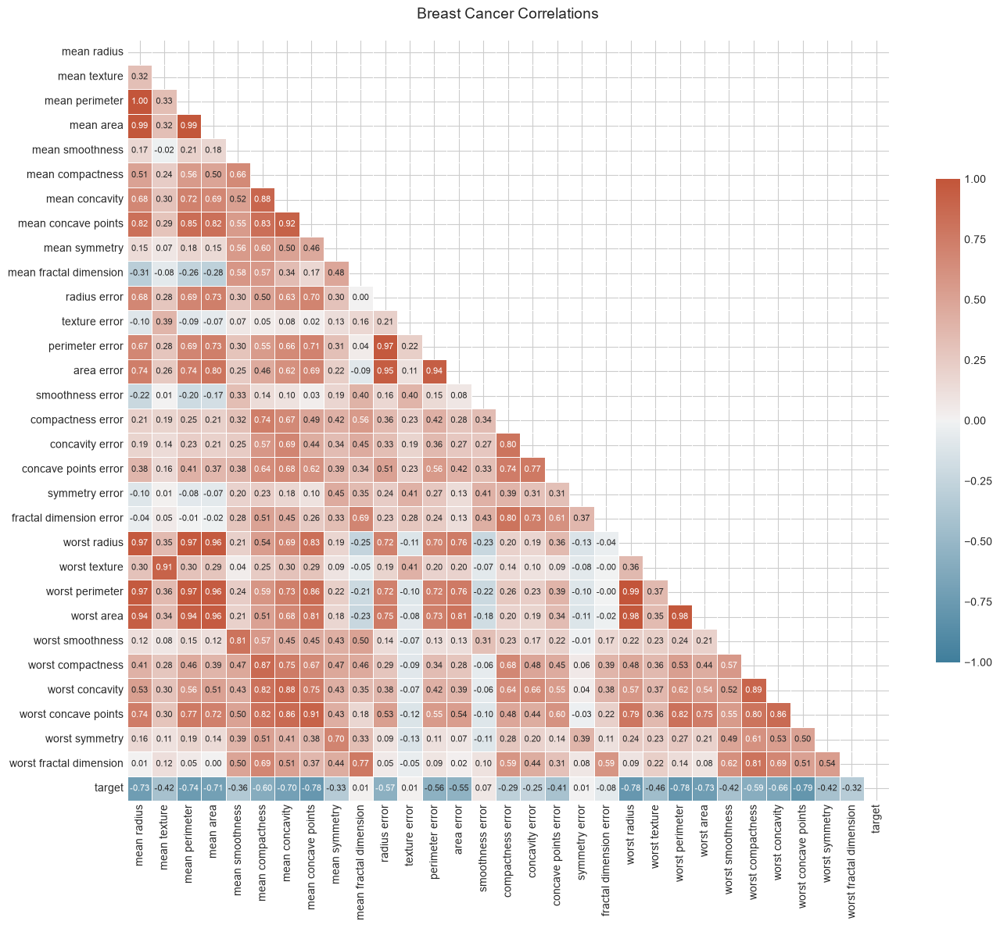

In [265]:
plot_correlation_heatmap(df_bc, title="Breast Cancer Correlations", annot_size=8)

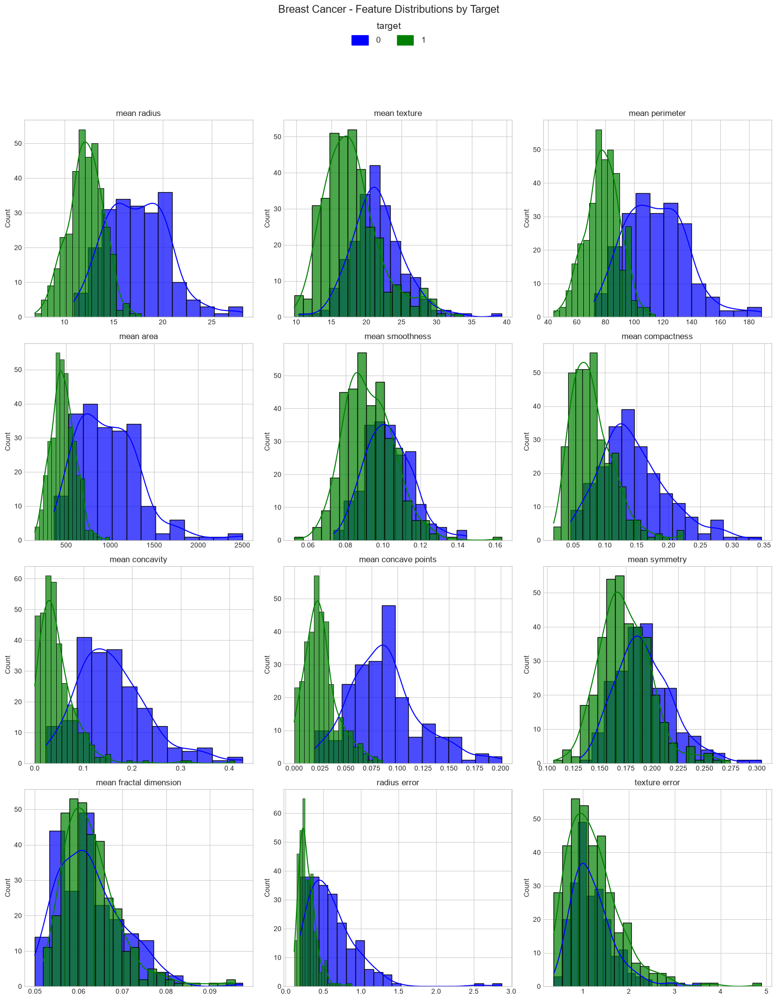

In [266]:
plot_all_histograms(
    df_bc,
    X_bc_cols[:12],
    hue_col="target",
    palette=["blue", "green"],
    title="Breast Cancer - Feature Distributions by Target",
    n_cols=3,
    figsize=(16, 20),
)

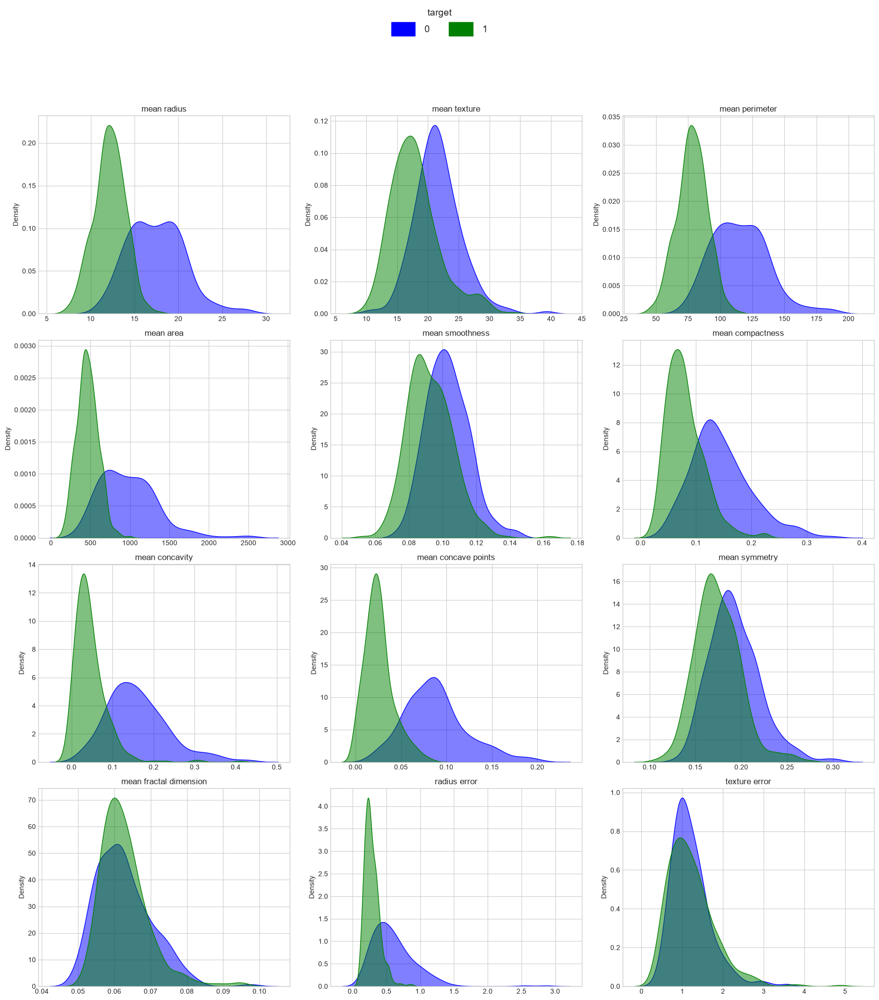

In [267]:
plot_kde_grid(
    df_bc,
    X_bc_cols[:12],
    hue_col="target",
    n_cols=3,
    figsize=(18, 20),
    palette=["blue", "green"],
    legend_fontsize=14,  # Larger labels
    legend_title_fontsize=14,  # Larger title
    handlelength=2.5,  # Longer color swatches
    handleheight=1.8,  # Taller color swatches
)

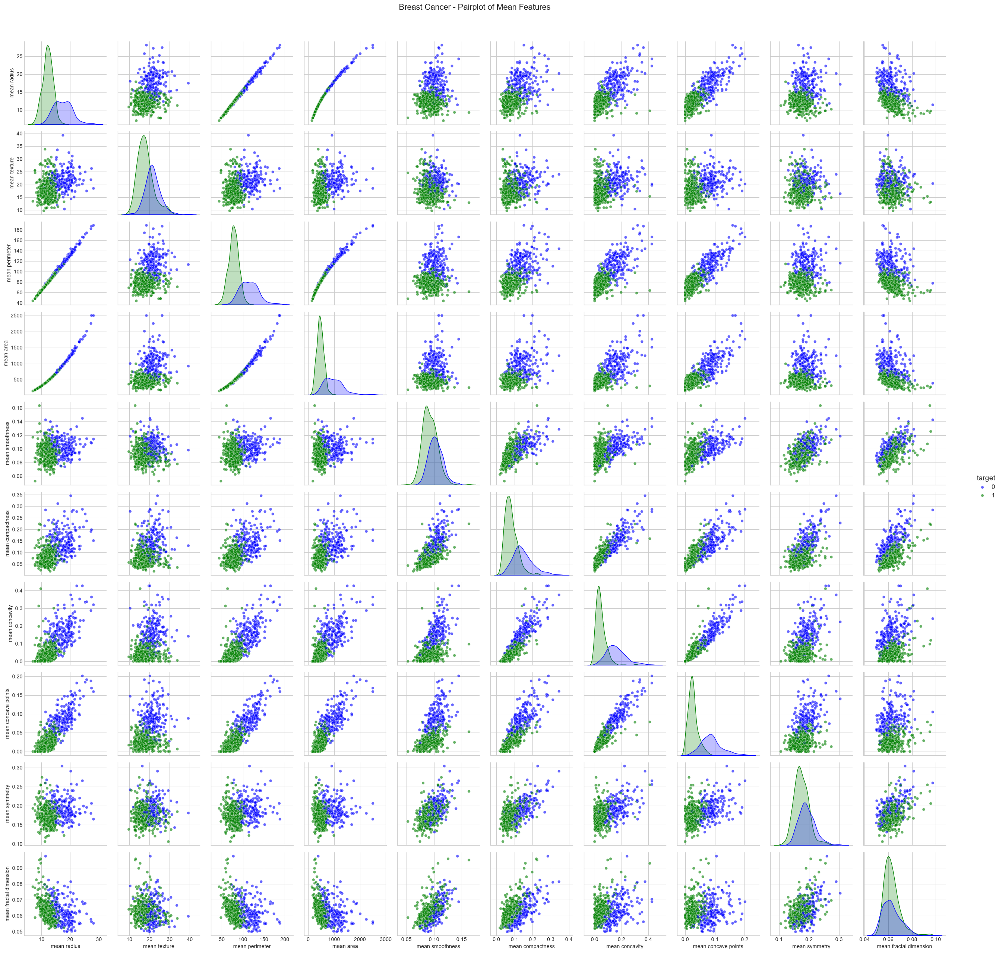

In [268]:
columns_mean = [
    "target",
    "mean radius",
    "mean texture",
    "mean perimeter",
    "mean area",
    "mean smoothness",
    "mean compactness",
    "mean concavity",
    "mean concave points",
    "mean symmetry",
    "mean fractal dimension",
]

# 1. Breast Cancer - legend inside
plot_pairplot(
    df_bc,
    hue_col="target",
    columns=columns_mean,
    palette=["blue", "green"],
    title="Breast Cancer - Pairplot of Mean Features",
    legend_loc="upper center",
    legend_fontsize=12,
    legend_title_fontsize=14,
)

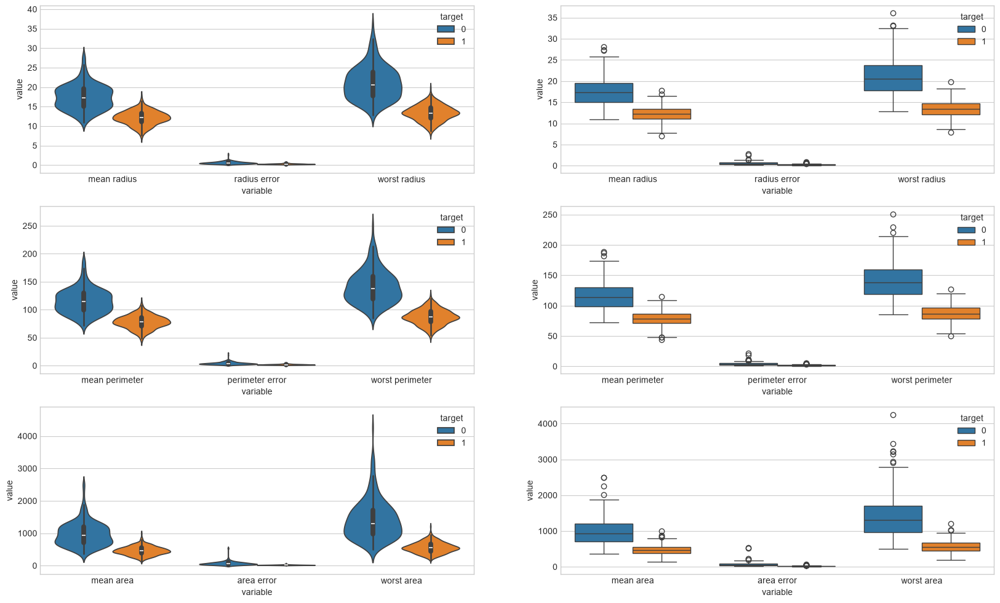

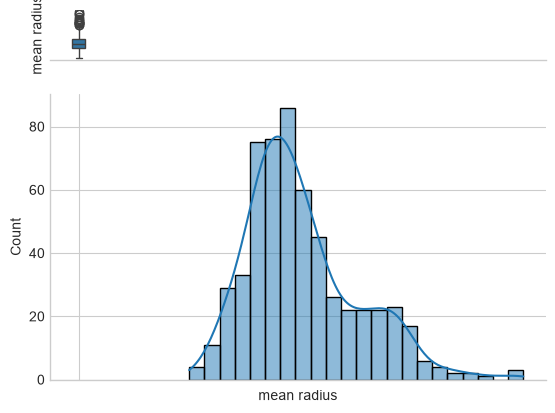

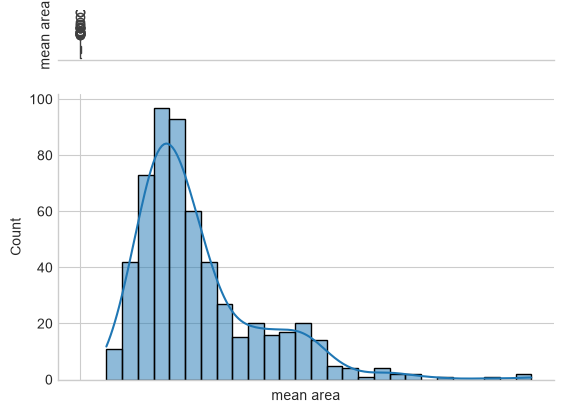

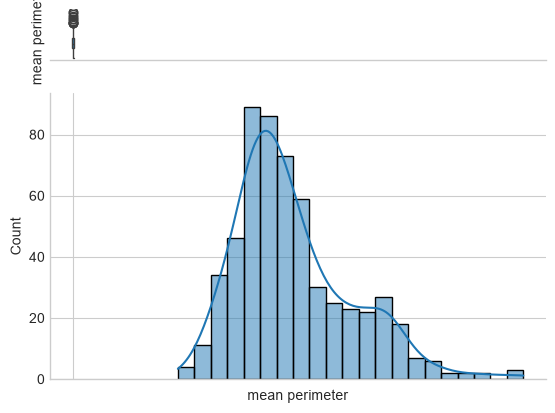

In [269]:
columns_set_1 = ["target", "mean radius", "radius error", "worst radius"]
df_set_1 = pd.DataFrame(df_bc, columns=columns_set_1)
# df_set_1

columns_set_2 = ["target", "mean perimeter", "perimeter error", "worst perimeter"]
df_set_2 = pd.DataFrame(df_bc, columns=columns_set_2)
# df_set_2

columns_set_3 = ["target", "mean area", "area error", "worst area"]
df_set_3 = pd.DataFrame(df_bc, columns=columns_set_3)
# df_set_3

fig, axs = plt.subplots(3, 2, figsize=(20, 12))
# Radius

sns.violinplot(
    x="variable",
    y="value",
    hue="target",
    data=pd.melt(df_set_1, id_vars="target"),
    density_norm="width",
    ax=axs[0, 0],
)
sns.boxplot(
    x="variable",
    y="value",
    hue="target",
    data=pd.melt(df_set_1, id_vars="target"),
    ax=axs[0, 1],
)
# Perimeter

sns.violinplot(
    x="variable",
    y="value",
    hue="target",
    data=pd.melt(df_set_2, id_vars="target"),
    density_norm="width",
    ax=axs[1, 0],
)
sns.boxplot(
    x="variable",
    y="value",
    hue="target",
    data=pd.melt(df_set_2, id_vars="target"),
    ax=axs[1, 1],
)
# Area

sns.violinplot(
    x="variable",
    y="value",
    hue="target",
    data=pd.melt(df_set_3, id_vars="target"),
    density_norm="width",
    ax=axs[2, 0],
)
sns.boxplot(
    x="variable",
    y="value",
    hue="target",
    data=pd.melt(df_set_3, id_vars="target"),
    ax=axs[2, 1],
)

# Get Density plots and box plots one below the other
get_box_dist_plot(df_bc["mean radius"])
get_box_dist_plot(df_bc["mean area"])
get_box_dist_plot(df_bc["mean perimeter"])

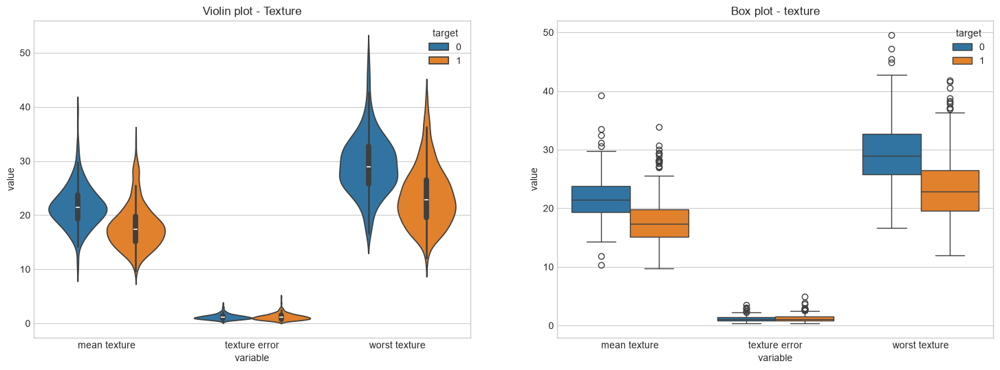

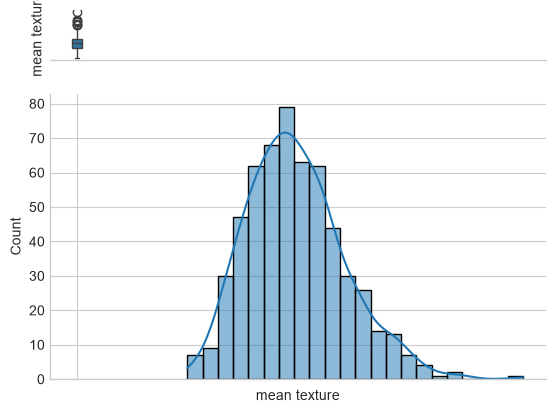

In [270]:
columns_set_4 = ["target", "mean texture", "texture error", "worst texture"]
df_set_4 = pd.DataFrame(df_bc, columns=columns_set_4)
# df_set_4

fig, axs = plt.subplots(1, 2, figsize=(18, 6))
sns.violinplot(
    x="variable",
    y="value",
    hue="target",
    data=pd.melt(df_set_4, id_vars="target"),
    density_norm="width",
    ax=axs[0],
)
axs[0].set_title("Violin plot - Texture")
sns.boxplot(
    x="variable",
    y="value",
    hue="target",
    data=pd.melt(df_set_4, id_vars="target"),
    ax=axs[1],
)
axs[1].set_title("Box plot - texture")
get_box_dist_plot(df_bc["mean texture"])

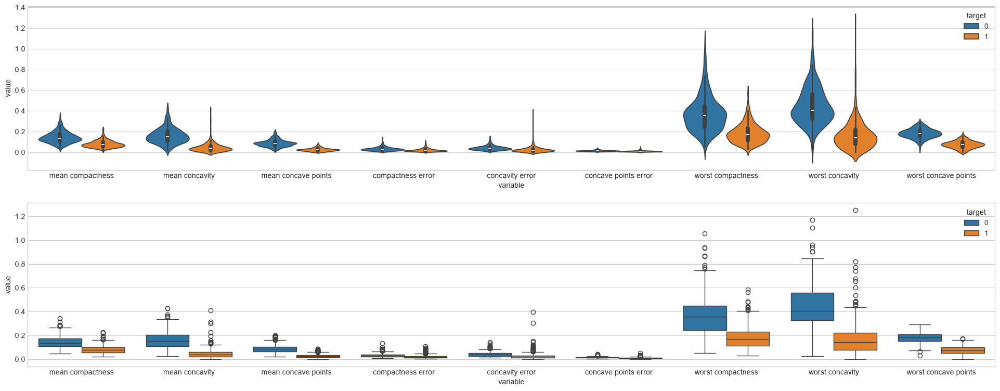

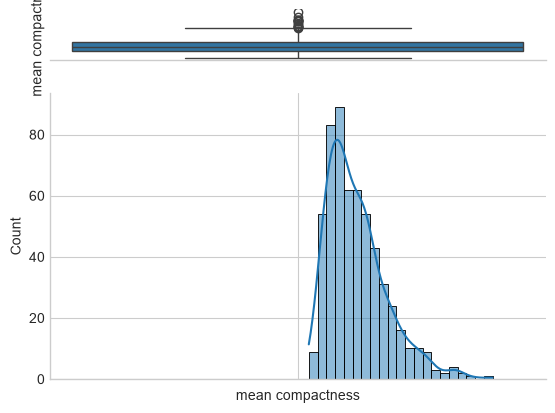

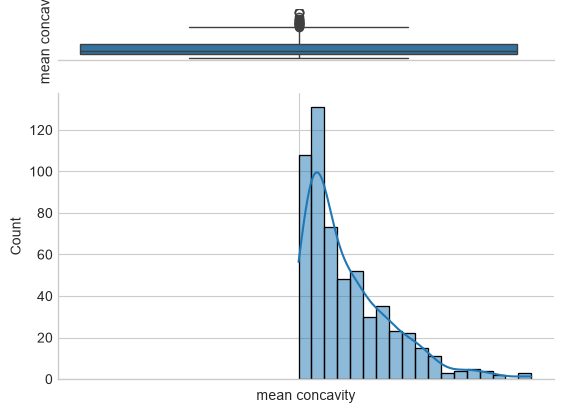

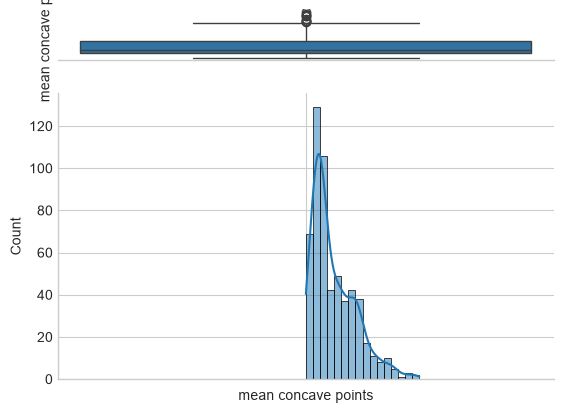

In [271]:
# Set :5 Compactness_mean,concavity_mean,concave_points_mean
# Compactness and Concavity
columns_set_5 = [
    "target",
    "mean compactness",
    "mean concavity",
    "mean concave points",
    "compactness error",
    "concavity error",
    "concave points error",
    "mean concave points",
    "worst compactness",
    "worst concavity",
    "worst concave points",
]
df_set_5 = pd.DataFrame(df_bc, columns=columns_set_5)

fig, axs = plt.subplots(2, figsize=(24, 9))
sns.violinplot(
    x="variable",
    y="value",
    hue="target",
    data=pd.melt(df_set_5, id_vars="target"),
    density_norm="width",
    ax=axs[0],
)
sns.boxplot(
    x="variable",
    y="value",
    hue="target",
    data=pd.melt(df_set_5, id_vars="target"),
    ax=axs[1],
)
get_box_dist_plot(df_bc["mean compactness"])
get_box_dist_plot(df_bc["mean concavity"])
get_box_dist_plot(df_bc["mean concave points"])

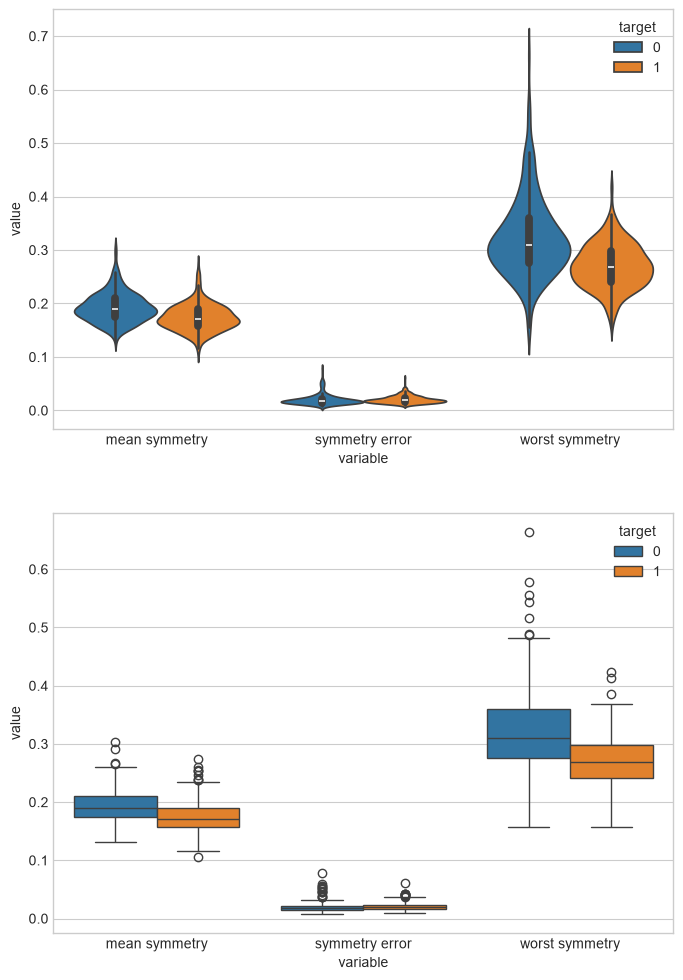

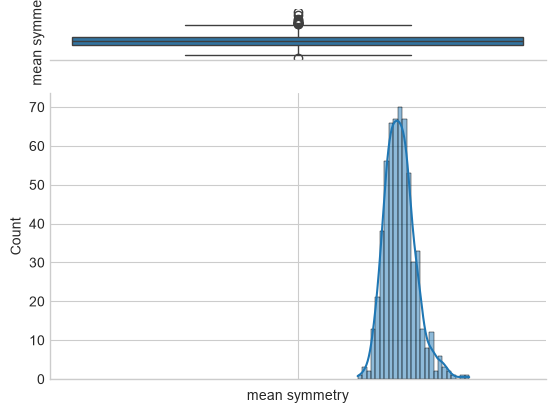

In [272]:
# Set 6: Symmetry_mean symmetry_se and symmetry_worst
columns_set_6 = ["target", "mean symmetry", "symmetry error", "worst symmetry"]
df_set_6 = pd.DataFrame(df_bc, columns=columns_set_6)
# df_set_6

fig, axs = plt.subplots(2, figsize=(8, 12))
sns.violinplot(
    x="variable",
    y="value",
    hue="target",
    data=pd.melt(df_set_6, id_vars="target"),
    density_norm="width",
    ax=axs[0],
)
sns.boxplot(
    x="variable",
    y="value",
    hue="target",
    data=pd.melt(df_set_6, id_vars="target"),
    ax=axs[1],
)
get_box_dist_plot(df_bc["mean symmetry"])

PCA: Explained variance = 63.24% (44.27%, 18.97%)
t-SNE: Applied successfully


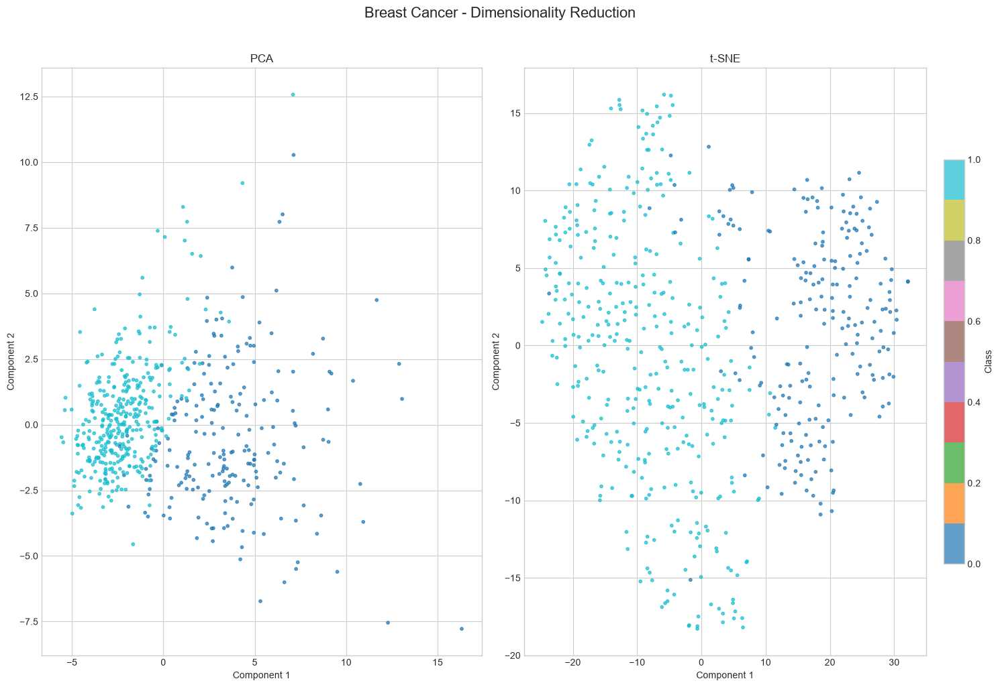

In [273]:
# Breast Cancer
reducer_bc = DimensionalityReducer(n_components=2, random_state=42)
reducer_bc.fit_transform(X_bc, y_bc, methods=["PCA", "t-SNE"])
reducer_bc.plot_results(
    y_bc,
    title_prefix="Breast Cancer - Dimensionality Reduction",
    figsize=(15, 10),
    n_cols=2,
)

# Adult Income

In [274]:
df_adult.columns

Index(['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss',
       'hours-per-week', 'income'],
      dtype='str')

In [275]:
df_adult.shape

(48842, 7)

In [276]:
df_adult.isna().sum()

age               0
fnlwgt            0
education-num     0
capital-gain      0
capital-loss      0
hours-per-week    0
income            0
dtype: int64

In [277]:
df_adult.nunique()

age                  74
fnlwgt            28523
education-num        16
capital-gain        123
capital-loss         99
hours-per-week       96
income                2
dtype: int64

In [278]:
df_adult.info()

<class 'pandas.DataFrame'>
Index: 48842 entries, 0 to 48841
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   age             48842 non-null  int64
 1   fnlwgt          48842 non-null  int64
 2   education-num   48842 non-null  int64
 3   capital-gain    48842 non-null  int64
 4   capital-loss    48842 non-null  int64
 5   hours-per-week  48842 non-null  int64
 6   income          48842 non-null  str  
dtypes: int64(6), str(1)
memory usage: 3.2 MB


In [279]:
df_adult.describe().T

,count,mean,std,min,25%,50%,75%,max
age,48842.0,38.643585,13.710510,17.0,28.0,37.0,48.0,90.0
fnlwgt,48842.0,189664.134597,105604.025423,12285.0,117550.5,178144.5,237642.0,1490400.0
education-num,48842.0,10.078089,2.570973,1.0,9.0,10.0,12.0,16.0
capital-gain,48842.0,1079.067626,7452.019058,0.0,0.0,0.0,0.0,99999.0
capital-loss,48842.0,87.502314,403.004552,0.0,0.0,0.0,0.0,4356.0
hours-per-week,48842.0,40.422382,12.391444,1.0,40.0,40.0,45.0,99.0


In [280]:
y_adult.describe().T

count     48842
unique        2
top       <=50K
freq      37155
Name: income, dtype: object

In [281]:
X_adult.cov().T

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
age,187.978083,-1.109486e+05,1.090628,7.890565e+03,314.637298,12.157262
fnlwgt,-110948.649105,1.115221e+10,-10523.722187,-2.916791e+06,-185818.540554,-17690.405781
education-num,1.090628,-1.052372e+04,6.609901,2.397673e+03,83.896136,4.577651
capital-gain,7890.565001,-2.916791e+06,2397.673247,5.553259e+07,-94422.847037,7586.507972
capital-loss,314.637298,-1.858185e+05,83.896136,-9.442285e+04,162412.669033,271.998838
hours-per-week,12.157262,-1.769041e+04,4.577651,7.586508e+03,271.998838,153.547885


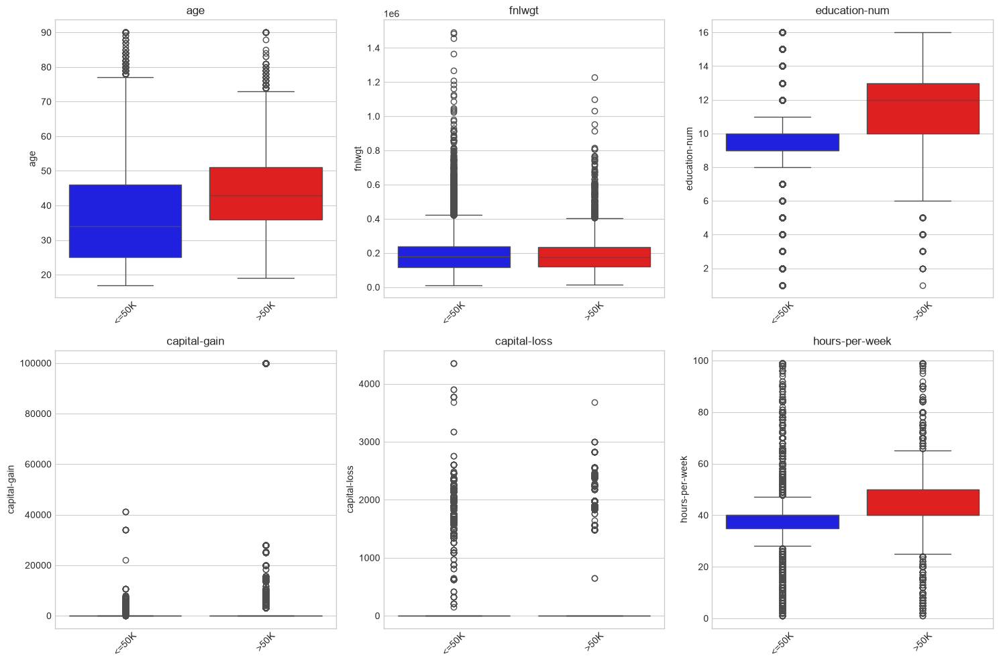

In [282]:
# 3. Adult Income - with hue (income)
plot_boxplots(
    df_adult,
    X_adult_cols,
    hue_col="income",
    figsize=(15, 10),
    n_cols=3,
    palette=["blue", "red"],
)

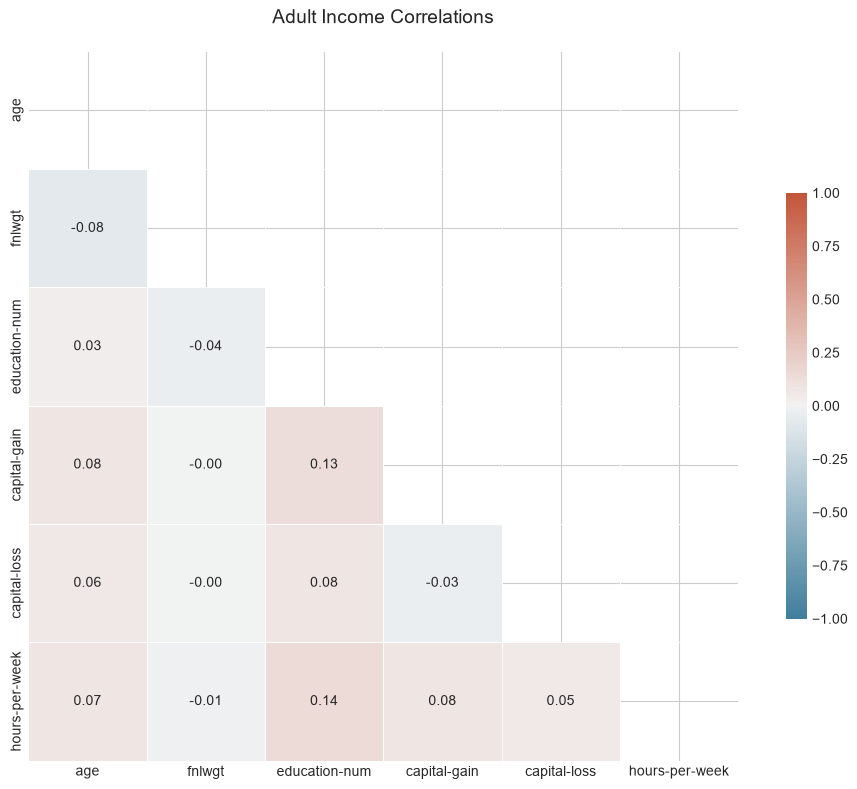

In [283]:
plot_correlation_heatmap(
    X_adult, title="Adult Income Correlations", figsize=(10, 8), annot_size=10
)

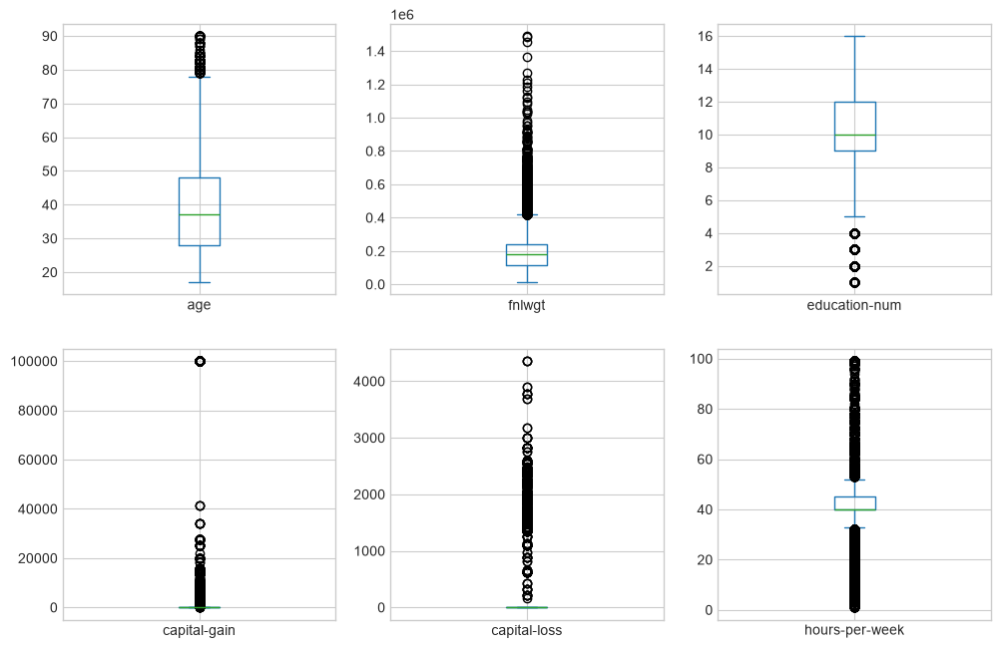

In [284]:
df_adult.plot(kind="box", figsize=(12, 12), layout=(3, 3), sharex=False, subplots=True);

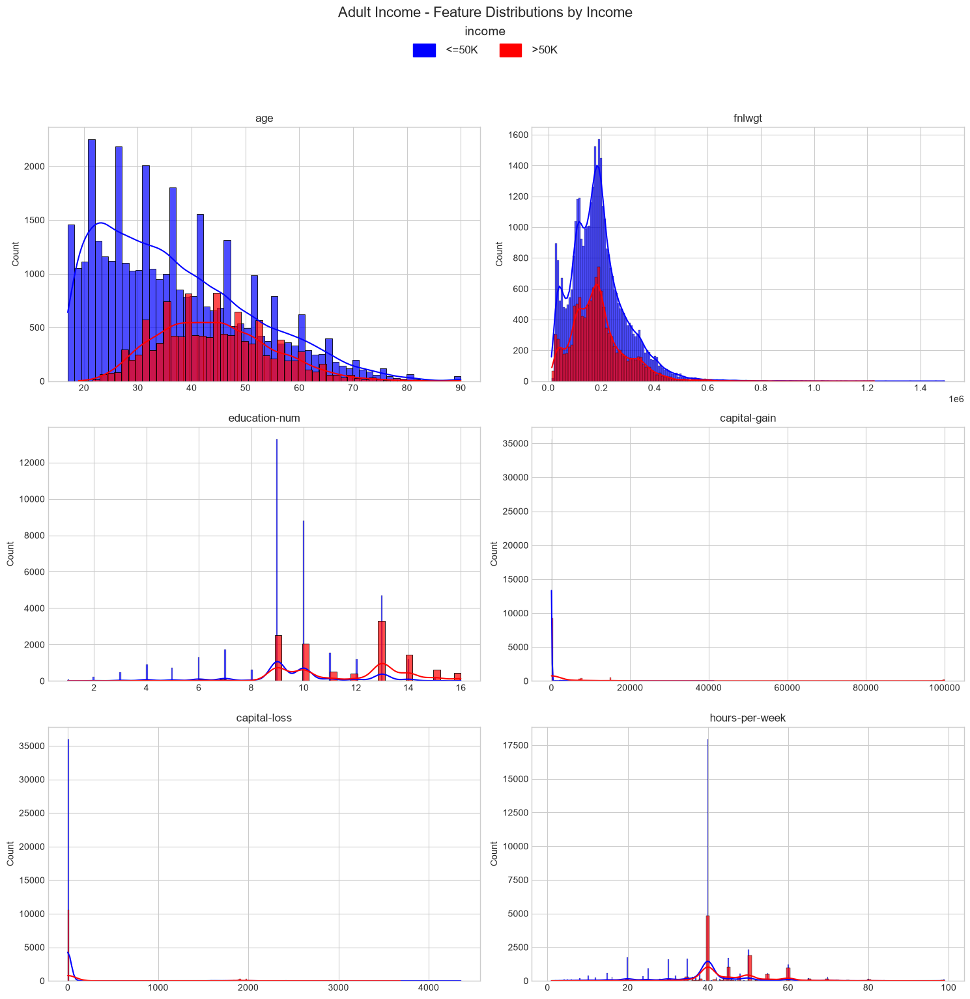

In [285]:
plot_all_histograms(
    df_adult,
    X_adult_cols,
    hue_col="income",
    palette=["blue", "red"],
    title="Adult Income - Feature Distributions by Income",
    n_cols=2,
    figsize=(15, 15),
)

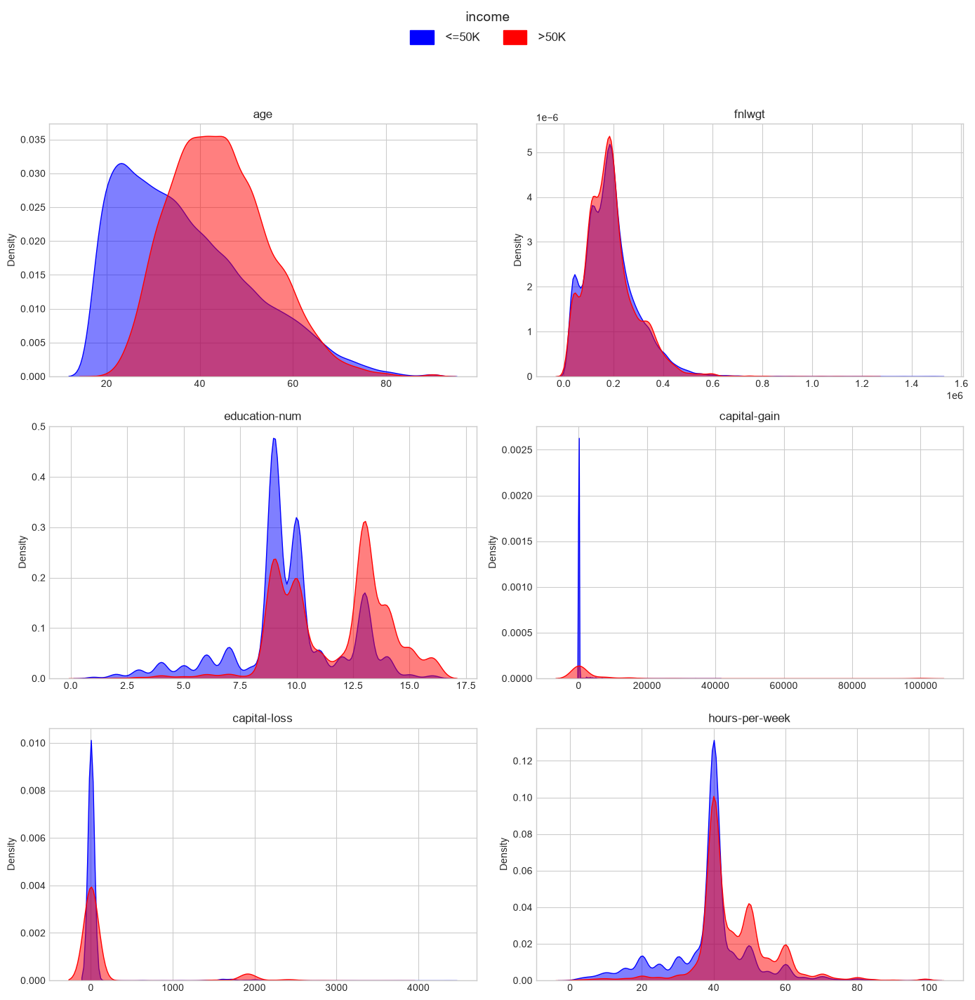

In [286]:
# Adult Income KDE grid
plot_kde_grid(
    df_adult,
    X_adult_cols,
    hue_col="income",
    n_cols=2,
    figsize=(14, 14),
    palette=["blue", "red"],
)

In [287]:
df_adult.columns

Index(['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss',
       'hours-per-week', 'income'],
      dtype='str')

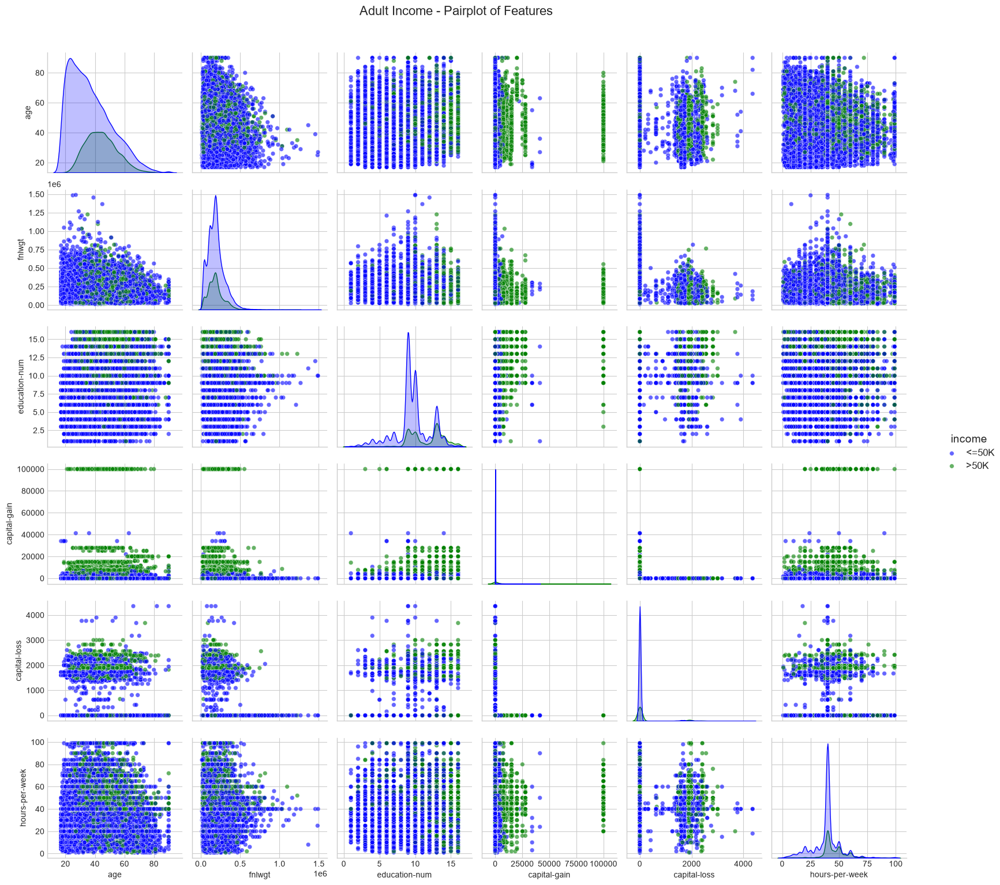

In [288]:
# 2. Adult Income - legend outside
columns = [col for col in df_adult.columns if col != "income"]

plot_pairplot(
    df_adult,
    hue_col="income",
    columns=columns,
    palette=["blue", "green"],
    title="Adult Income - Pairplot of Features",
    legend_loc="outside",
)


Adult Income - Dimensionality Reduction (Sampled)
Sampled 1000 rows from 48842 total rows
y_adult_numeric shape: (1000,)
Class distribution: 0: 761, 1: 239
PCA: Explained variance = 40.60% (22.80%, 17.79%)
t-SNE: Applied successfully


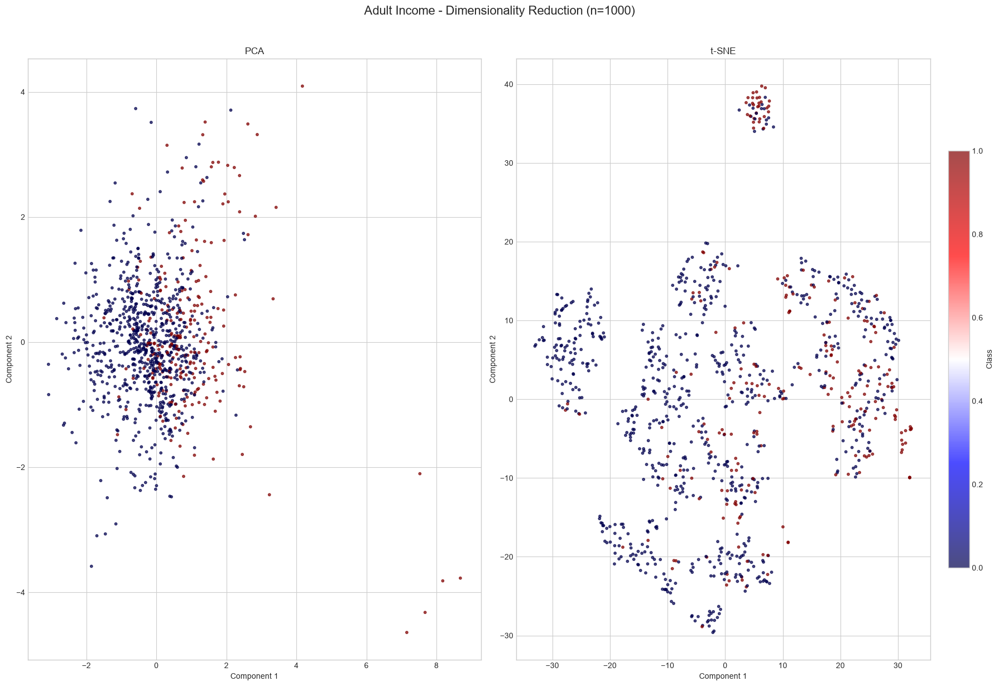

In [289]:
print("\n" + "=" * 60)
print("Adult Income - Dimensionality Reduction (Sampled)")
print("=" * 60)

# Sample Adult Income for performance
adult_sample_size = 1000
adult_indices = np.random.choice(X_adult.shape[0], adult_sample_size, replace=False)
X_adult_sample = X_adult.iloc[adult_indices]
y_adult_sample = y_adult.iloc[adult_indices]

# Convert target to numeric - y_adult_sample is a Series
y_adult_numeric = (y_adult_sample == ">50K").astype(int).values

print(f"Sampled {adult_sample_size} rows from {X_adult.shape[0]} total rows")
print(f"y_adult_numeric shape: {y_adult_numeric.shape}")
print(
    f"Class distribution: 0: {np.sum(y_adult_numeric == 0)}, 1: {np.sum(y_adult_numeric == 1)}"
)

# Adult Income
reducer_adult = DimensionalityReducer(n_components=2, random_state=42)
reducer_adult.fit_transform(X_adult_sample, y_adult_numeric, methods=["PCA", "t-SNE"])
reducer_adult.plot_results(
    y_adult_numeric,
    title_prefix=f"Adult Income - Dimensionality Reduction (n={adult_sample_size})",
    figsize=(18, 12),
    n_cols=2,
    cmap="seismic",
)

# Covertype

In [290]:
df_cover.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Cover_Type
0,2596,51,3,258,0,510,221,232,148,6279,5
1,2590,56,2,212,-6,390,220,235,151,6225,5
2,2804,139,9,268,65,3180,234,238,135,6121,2
3,2785,155,18,242,118,3090,238,238,122,6211,2
4,2595,45,2,153,-1,391,220,234,150,6172,5


In [291]:
df_cover.shape

(581012, 11)

In [292]:
df_cover.info()

<class 'pandas.DataFrame'>
Index: 581012 entries, 0 to 581011
Data columns (total 11 columns):
 #   Column                              Non-Null Count   Dtype
---  ------                              --------------   -----
 0   Elevation                           581012 non-null  int64
 1   Aspect                              581012 non-null  int64
 2   Slope                               581012 non-null  int64
 3   Horizontal_Distance_To_Hydrology    581012 non-null  int64
 4   Vertical_Distance_To_Hydrology      581012 non-null  int64
 5   Horizontal_Distance_To_Roadways     581012 non-null  int64
 6   Hillshade_9am                       581012 non-null  int64
 7   Hillshade_Noon                      581012 non-null  int64
 8   Hillshade_3pm                       581012 non-null  int64
 9   Horizontal_Distance_To_Fire_Points  581012 non-null  int64
 10  Cover_Type                          581012 non-null  int8 
dtypes: int64(10), int8(1)
memory usage: 49.3 MB


In [293]:
df_cover.isna().sum()

Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Cover_Type                            0
dtype: int64

In [294]:
df_cover.describe().T

,count,mean,std,min,25%,50%,75%,max
Elevation,581012.0,2959.365301,279.984734,1859.0,2809.0,2996.0,3163.0,3858.0
Aspect,581012.0,155.656807,111.913721,0.0,58.0,127.0,260.0,360.0
Slope,581012.0,14.103704,7.488242,0.0,9.0,13.0,18.0,66.0
Horizontal_Distance_To_Hydrology,581012.0,269.428217,212.549356,0.0,108.0,218.0,384.0,1397.0
Vertical_Distance_To_Hydrology,581012.0,46.418855,58.295232,-173.0,7.0,30.0,69.0,601.0
Horizontal_Distance_To_Roadways,581012.0,2350.146611,1559.254870,0.0,1106.0,1997.0,3328.0,7117.0
Hillshade_9am,581012.0,212.146049,26.769889,0.0,198.0,218.0,231.0,254.0
Hillshade_Noon,581012.0,223.318716,19.768697,0.0,213.0,226.0,237.0,254.0
Hillshade_3pm,581012.0,142.528263,38.274529,0.0,119.0,143.0,168.0,254.0
Horizontal_Distance_To_Fire_Points,581012.0,1980.291226,1324.195210,0.0,1024.0,1710.0,2550.0,7173.0


In [295]:
df_cover.nunique()

Elevation                             1978
Aspect                                 361
Slope                                   67
Horizontal_Distance_To_Hydrology       551
Vertical_Distance_To_Hydrology         700
Horizontal_Distance_To_Roadways       5785
Hillshade_9am                          207
Hillshade_Noon                         185
Hillshade_3pm                          255
Horizontal_Distance_To_Fire_Points    5827
Cover_Type                               7
dtype: int64

In [296]:
df_cover.cov().T

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Cover_Type
Elevation,78391.451413,493.040656,-508.836171,18223.860214,1522.926632,1.595913e+05,840.801856,1139.570358,633.844379,5.487965e+04,-105.395497
Aspect,493.040656,12524.680949,65.977321,413.326302,458.673179,4.383611e+03,-1735.454064,743.590319,2771.148834,-1.617874e+04,2.669368
Slope,-508.836171,65.977321,56.073765,-16.882788,120.034803,-2.521030e+03,-65.590114,-78.000049,-50.401219,-1.841004e+03,1.550674
Horizontal_Distance_To_Hydrology,18223.860214,413.326302,-16.882788,45177.228564,7511.630097,2.387197e+04,-154.130303,196.604000,425.712403,1.460016e+04,-6.030503
Vertical_Distance_To_Hydrology,1522.926632,458.673179,120.034803,7511.630097,3398.334030,-4.215079e+03,-259.571780,-127.869009,77.873331,-5.396849e+03,6.648231
Horizontal_Distance_To_Roadways,159591.320997,4383.611237,-2521.030488,23871.971855,-4215.078620,2.431276e+06,1433.769309,5840.027440,6333.165782,6.846315e+05,-334.137795
Hillshade_9am,840.801856,-1735.454064,-65.590114,-154.130303,-259.571780,1.433769e+03,716.626947,5.311559,-799.495050,4.702921e+03,-1.323964
Hillshade_Noon,1139.570358,743.590319,-78.000049,196.604000,-127.869009,5.840027e+03,5.311559,390.801387,449.649773,1.500727e+03,-2.662039
Hillshade_3pm,633.844379,2771.148834,-50.401219,425.712403,77.873331,6.333166e+03,-799.495050,449.649773,1464.939588,-2.431796e+03,-2.581112
Horizontal_Distance_To_Fire_Points,54879.651234,-16178.737547,-1841.004188,14600.157156,-5396.849445,6.846315e+05,4702.921424,1500.727145,-2431.796409,1.753493e+06,-201.448422


In [297]:
y_cover.value_counts()

Cover_Type
2    283301
1    211840
3     35754
7     20510
6     17367
5      9493
4      2747
Name: count, dtype: int64

In [298]:
# Sample Covertype
covertype_sample_size = 1000
rng = np.random.default_rng(42)
covertype_indices = rng.choice(X_cover.shape[0], covertype_sample_size, replace=False)
X_cover_sample = X_cover.iloc[covertype_indices]

# FIX: y_cover is a Series, use it directly
y_cover_sample = y_cover.iloc[covertype_indices].values

# Create sampled DataFrame
df_cover_sample = pd.concat([X_cover_sample, y_cover.iloc[covertype_indices]], axis=1)

print(f"Sampled {covertype_sample_size} rows from {X_cover.shape[0]} total rows")
print(f"y_cover_sample shape: {y_cover_sample.shape}")
print(f"y_cover_sample unique values: {np.unique(y_cover_sample)}")

Sampled 1000 rows from 581012 total rows
y_cover_sample shape: (1000,)
y_cover_sample unique values: [1 2 3 4 5 6 7]


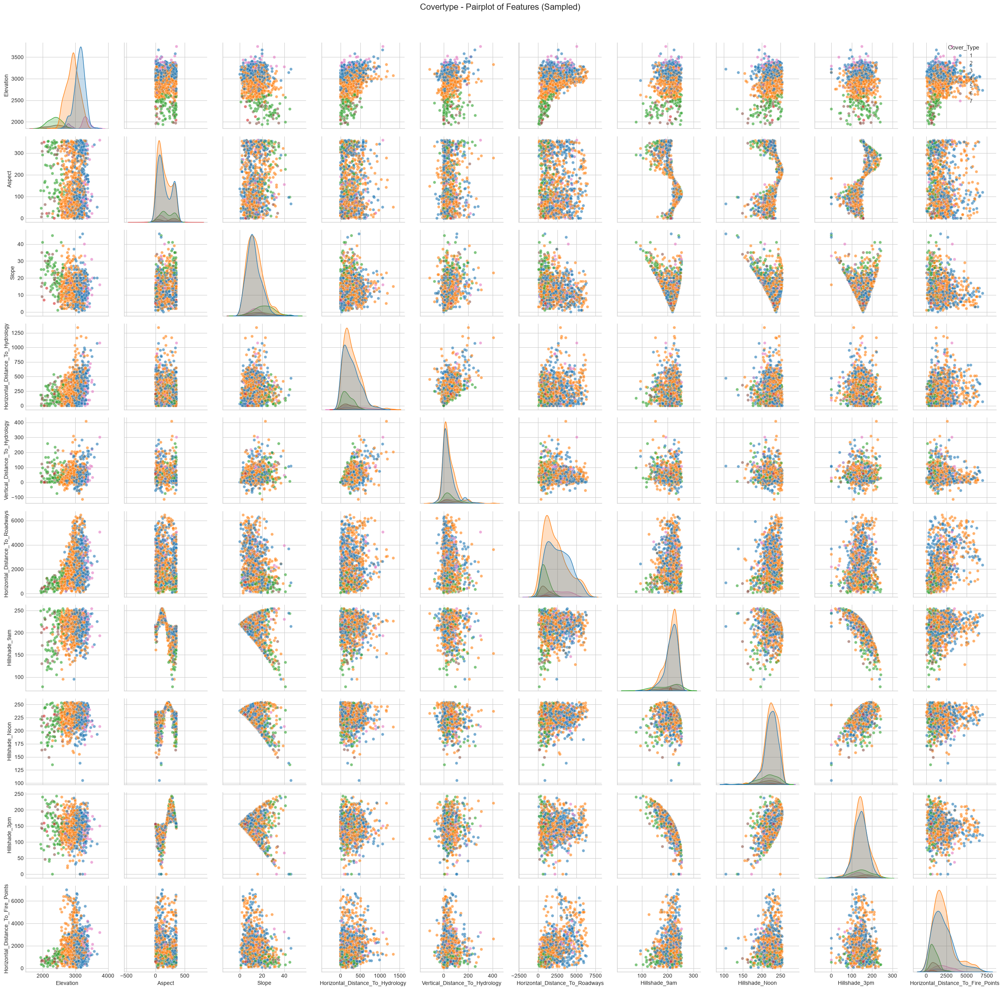

In [299]:
# 3. Covertype - legend with smaller font for 7 classes
columns = [
    "Cover_Type",
    "Elevation",
    "Aspect",
    "Slope",
    "Horizontal_Distance_To_Hydrology",
    "Vertical_Distance_To_Hydrology",
    "Horizontal_Distance_To_Roadways",
    "Hillshade_9am",
    "Hillshade_Noon",
    "Hillshade_3pm",
    "Horizontal_Distance_To_Fire_Points",
]

plot_pairplot(
    df_cover_sample,
    hue_col="Cover_Type",
    columns=columns,
    palette="tab10",
    title="Covertype - Pairplot of Features (Sampled)",
    legend_fontsize=9,
    legend_title_fontsize=11,
)

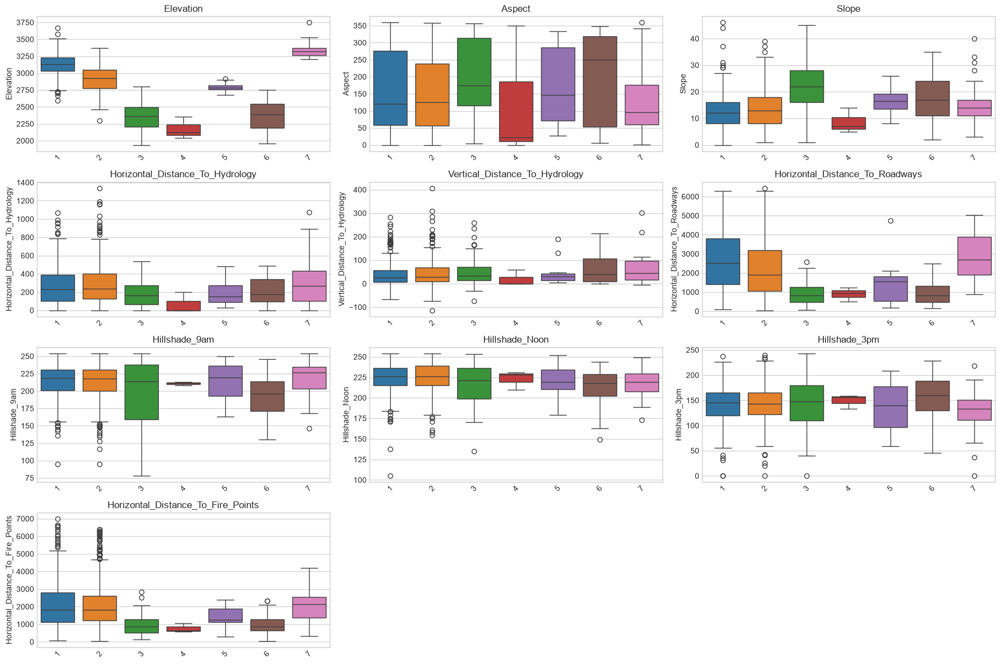

In [300]:
# 4. Covertype - with hue (Cover_Type) - USING SAMPLED DATA
plot_boxplots(
    df_cover_sample,
    X_cover_cols,
    hue_col="Cover_Type",
    figsize=(18, 12),
    n_cols=3,
    palette="tab10",
)

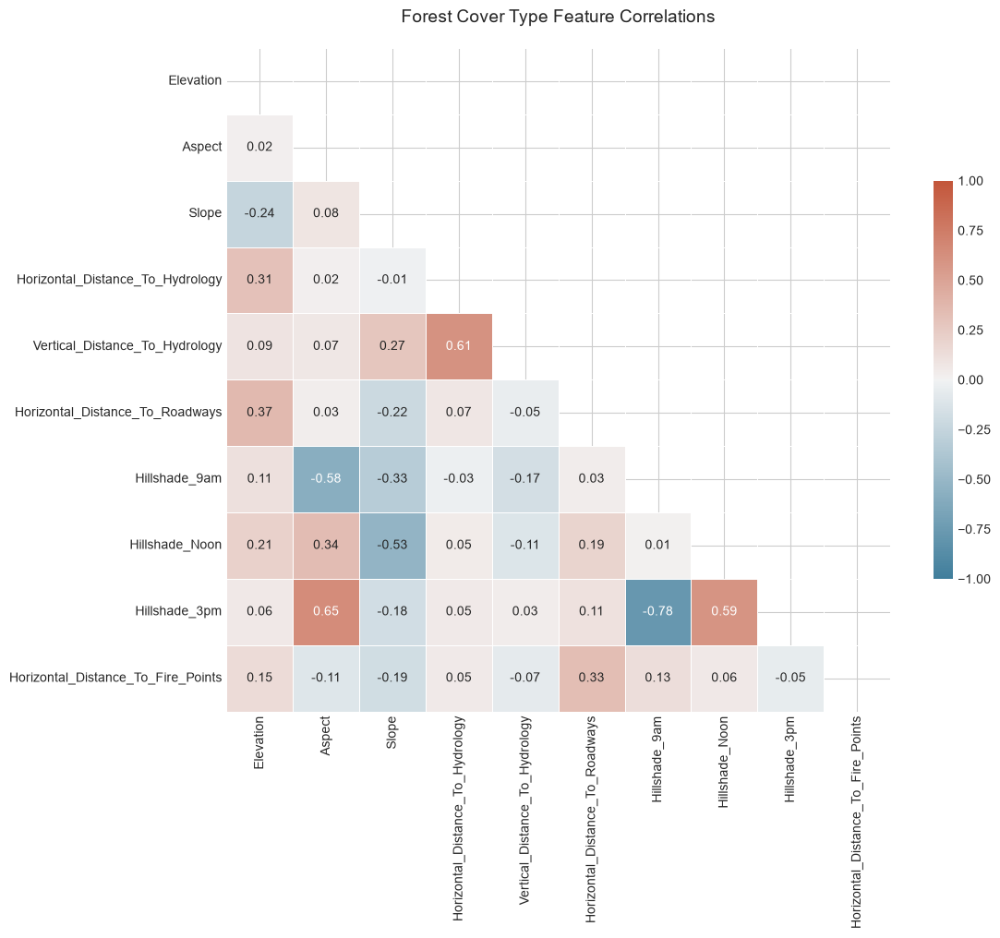

In [301]:
plot_correlation_heatmap(
    X_cover,
    title="Forest Cover Type Feature Correlations",
    figsize=(12, 10),
    annot_size=10,
)

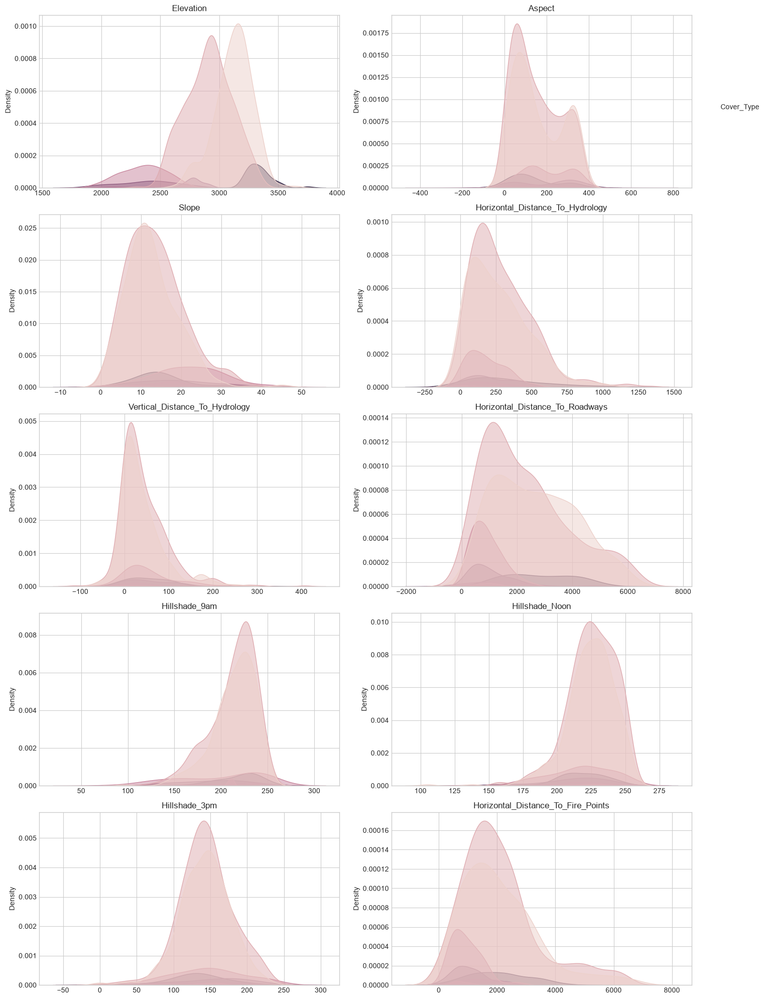

In [302]:
fig, axes = plt.subplots(5, 2, figsize=(14, 20))
axes_flat = axes.flatten()

# First, create all plots without individual legends
for i, col in enumerate(X_cover_cols):
    sns.kdeplot(
        data=df_cover_sample,
        x=col,
        hue="Cover_Type",
        fill=True,
        alpha=0.5,
        ax=axes_flat[i],
    )
    axes_flat[i].set_title(col)
    axes_flat[i].set_xlabel("")
    axes_flat[i].get_legend().remove()  # Remove individual legend

# Remove empty subplots
for j in range(len(X_cover_cols), len(axes_flat)):
    fig.delaxes(axes_flat[j])

# Add a single legend to the figure
handles, labels = axes_flat[0].get_legend_handles_labels()
# Remove duplicate labels
unique_labels = []
unique_handles = []
for handle, label in zip(handles, labels):
    if label not in unique_labels:
        unique_labels.append(label)
        unique_handles.append(handle)

fig.legend(
    unique_handles,
    unique_labels,
    bbox_to_anchor=(1.02, 0.9),
    loc="upper left",
    title="Cover_Type",
)

plt.tight_layout()
plt.show()

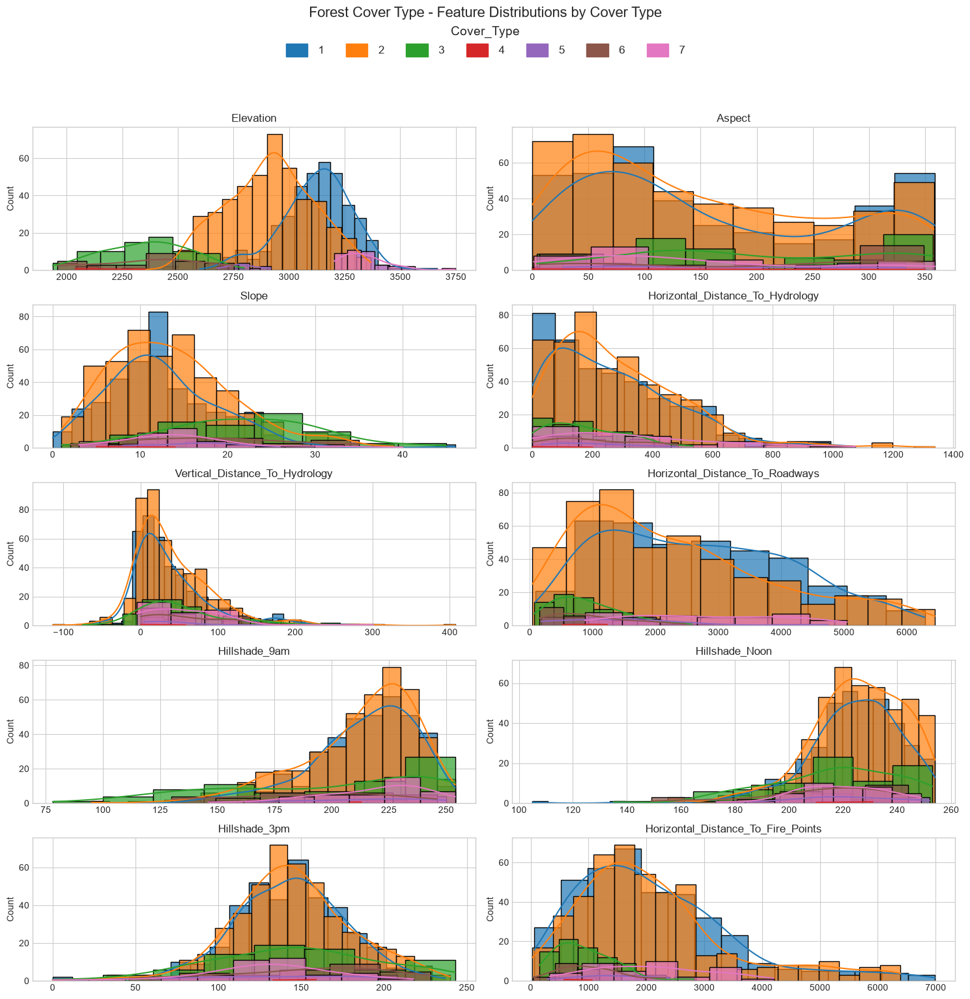

In [303]:
plot_all_histograms(
    df_cover_sample,
    X_cover_cols,
    hue_col="Cover_Type",
    palette="tab10",
    title="Forest Cover Type - Feature Distributions by Cover Type",
    n_cols=2,
    figsize=(15, 15),
)

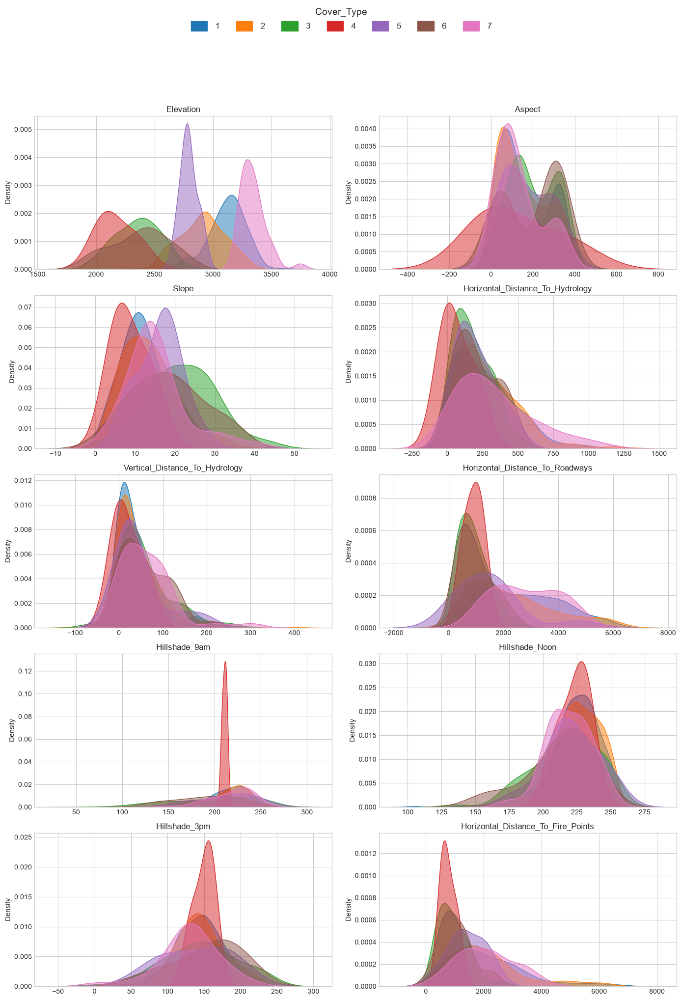

In [304]:
# Covertype KDE grid
plot_kde_grid(
    df_cover_sample,
    X_cover_cols,
    hue_col="Cover_Type",
    n_cols=2,
    figsize=(14, 20),
    palette="tab10",
)


COVERTYPE - DIMENSIONALITY REDUCTION (Sampled)
Sampled 1000 rows from 581012 total rows
PCA: Explained variance = 47.67% (25.66%, 22.01%)
t-SNE: Applied successfully


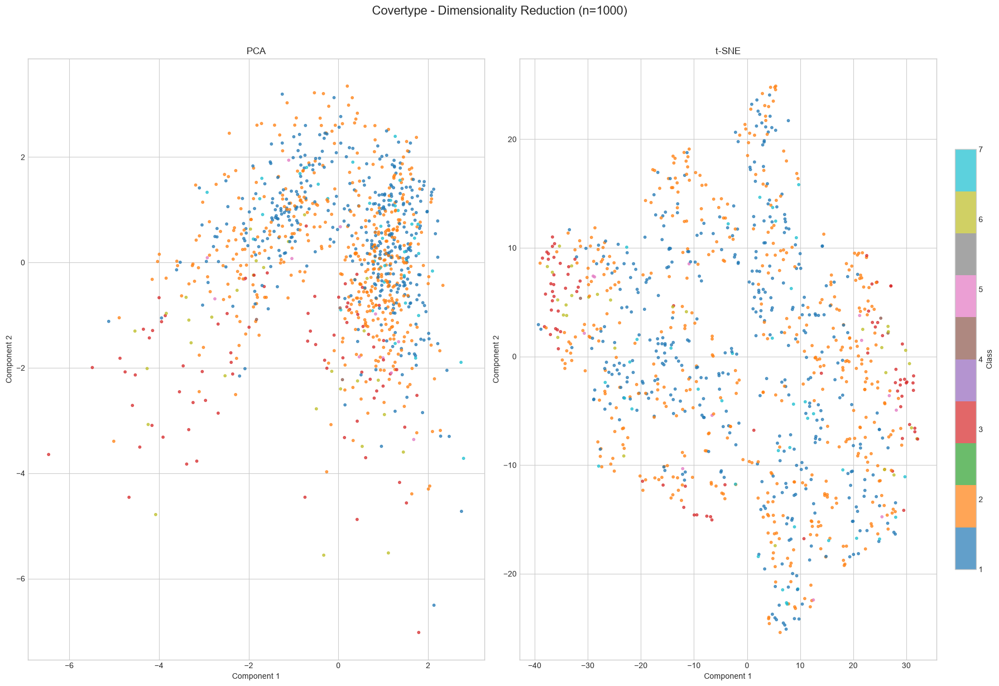

In [305]:
# ============================================================================
# Example: Covertype (with sampling)
# ============================================================================
print("\n" + "=" * 60)
print("COVERTYPE - DIMENSIONALITY REDUCTION (Sampled)")
print("=" * 60)

# Sample Covertype
print(f"Sampled {covertype_sample_size} rows from {X_cover.shape[0]} total rows")

# Covertype
reducer_cover = DimensionalityReducer(n_components=2, random_state=42)
reducer_cover.fit_transform(X_cover_sample, y_cover_sample, methods=["PCA", "t-SNE"])
reducer_cover.plot_results(
    y_cover_sample,
    title_prefix=f"Covertype - Dimensionality Reduction (n={covertype_sample_size})",
    figsize=(18, 12),
    n_cols=2,
    cmap="tab10",
)

# MNIST

In [306]:
print(f"Mnist DataFrame shape: {df_mnist.shape}")
print(f"Memory usage: {df_mnist.memory_usage(deep=True).sum() / 1024**2:.2f} MB")
print(f"Columns: {df_mnist.columns.tolist()[:5]}... (showing first 5)")

# Separate features and labels
# X_mnist = df_mnist.drop('label', axis=1).values
# y_mnist = df_mnist['label'].values

Mnist DataFrame shape: (70000, 785)
Memory usage: 52.94 MB
Columns: ['pixel_0', 'pixel_1', 'pixel_2', 'pixel_3', 'pixel_4']... (showing first 5)


In [307]:
print("\n" + "=" * 60)
print("1. BASIC DATASET INFORMATION")
print("=" * 60)
print(f"Dataset shape: {X_mnist.shape}")
print(f"Number of samples: {X_mnist.shape[0]}")
print(f"Number of features (pixels): {X_mnist.shape[1]}")
print(f"Number of classes: {len(np.unique(y_mnist))}")
print(f"Classes: {np.unique(y_mnist)}")
print(
    f"Image dimensions: {int(np.sqrt(X_mnist.shape[1]))}x{int(np.sqrt(X_mnist.shape[1]))} pixels"
)
print(f"Pixel value range: {np.min(X_mnist):.0f} to {np.max(X_mnist):.0f}")
print(f"Data type: {X_mnist.values.dtype}")  # Numpy array dtype


1. BASIC DATASET INFORMATION
Dataset shape: (70000, 784)
Number of samples: 70000
Number of features (pixels): 784
Number of classes: 10
Classes: [0 1 2 3 4 5 6 7 8 9]
Image dimensions: 28x28 pixels
Pixel value range: 0 to 255
Data type: uint8



2. CLASS DISTRIBUTION
label
0    6903
1    7877
2    6990
3    7141
4    6824
5    6313
6    6876
7    7293
8    6825
9    6958
Name: count, dtype: int64


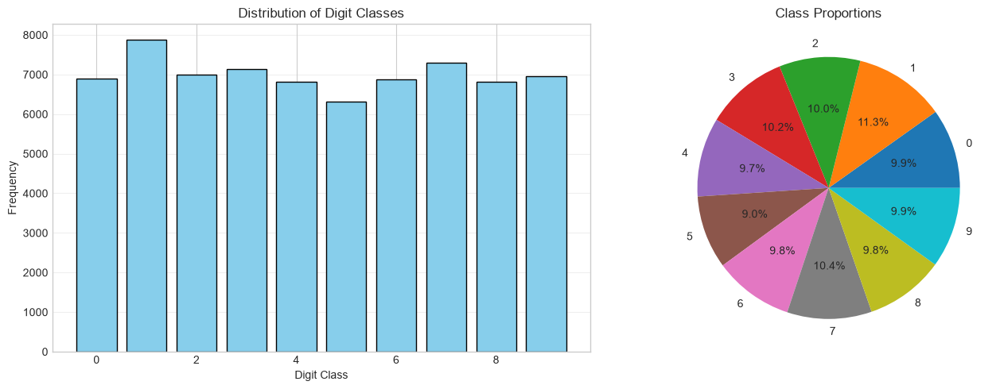

In [308]:
print("\n" + "=" * 60)
print("2. CLASS DISTRIBUTION")
print("=" * 60)
class_counts = pd.Series(y_mnist).value_counts().sort_index()
print(class_counts)

# Plot class distribution
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Bar plot
axes[0].bar(class_counts.index, class_counts.values, color="skyblue", edgecolor="black")
axes[0].set_xlabel("Digit Class")
axes[0].set_ylabel("Frequency")
axes[0].set_title("Distribution of Digit Classes")
axes[0].grid(axis="y", alpha=0.3)

# Pie chart
axes[1].pie(
    class_counts.values,
    labels=class_counts.index,
    autopct="%1.1f%%",
    colors=plt.cm.tab10.colors,
)
axes[1].set_title("Class Proportions")

plt.tight_layout()
plt.show()

In [309]:
if hasattr(X_mnist, "values"):
    X_mnist_array = X_mnist.values
else:
    X_mnist_array = X_mnist

if hasattr(y_mnist, "values"):
    y_mnist_array = y_mnist.values
else:
    y_mnist_array = y_mnist


3. Sample Images Visualization


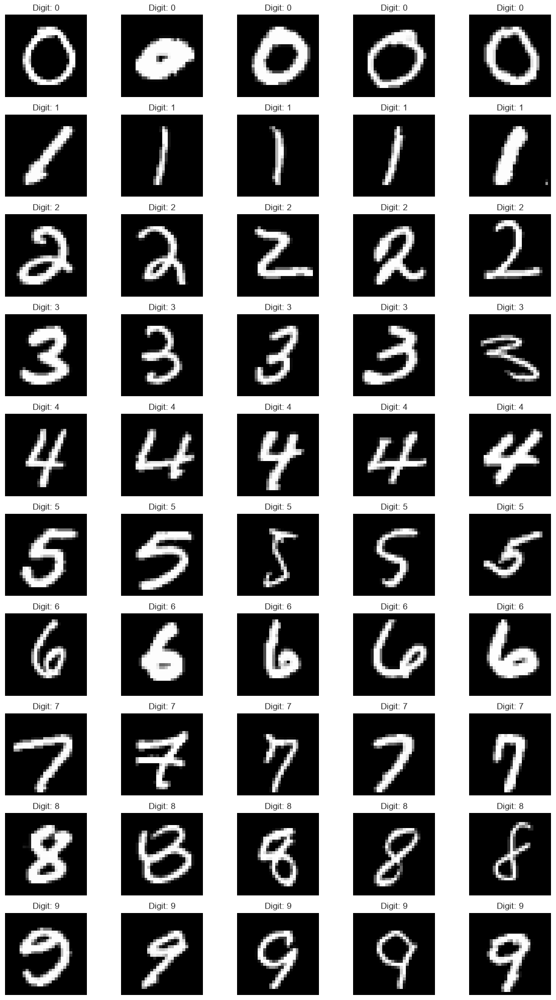

In [310]:
# ============================================================================
# 3. Sample Images Visualization
# ============================================================================

print("\n" + "=" * 60)
print("3. Sample Images Visualization")
print("=" * 60)

fig, axes = plt.subplots(10, 5, figsize=(12, 20))

for i in range(10):  # For each digit class
    # Get indices where y equals i
    class_indices = np.where(y_mnist_array == i)[0]  # Use y_mnist_array

    if len(class_indices) == 0:
        for j in range(5):
            axes[i, j].axis("off")
        continue

    # Get images for this class
    class_images = X_mnist_array[class_indices]

    n_samples = min(5, len(class_images))
    random_indices = np.random.choice(len(class_images), n_samples, replace=False)

    for j, idx in enumerate(random_indices):
        ax = axes[i, j]
        ax.imshow(class_images[idx].reshape(28, 28), cmap="gray")
        ax.set_title(f"Digit: {i}")
        ax.axis("off")

    # If fewer than 5 images, hide remaining subplots
    for j in range(n_samples, 5):
        axes[i, j].axis("off")

plt.tight_layout()
plt.show()


4. Pixel Intensity Distribution


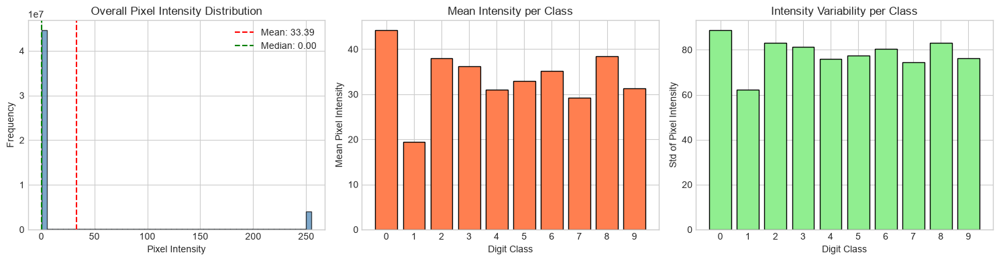

In [311]:
# ============================================================================
# 4. Pixel Intensity Distribution
# ============================================================================

print("\n" + "=" * 60)
print("4. Pixel Intensity Distribution")
print("=" * 60)

# Overall pixel intensity distribution
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# Histogram of all pixel values
axes[0].hist(
    X_mnist_array.flatten(), bins=50, color="steelblue", alpha=0.7, edgecolor="black"
)
axes[0].set_xlabel("Pixel Intensity")
axes[0].set_ylabel("Frequency")
axes[0].set_title("Overall Pixel Intensity Distribution")
axes[0].axvline(
    X_mnist_array.mean(),
    color="red",
    linestyle="--",
    label=f"Mean: {X_mnist_array.mean():.2f}",
)
axes[0].axvline(
    np.median(X_mnist_array),
    color="green",
    linestyle="--",
    label=f"Median: {np.median(X_mnist_array):.2f}",
)
axes[0].legend()

# Per-class mean intensity
class_means = []
for i in range(10):
    class_data = X_mnist_array[y_mnist_array == i]
    if len(class_data) > 0:
        class_means.append(class_data.mean())
    else:
        class_means.append(0)

axes[1].bar(range(10), class_means, color="coral", edgecolor="black")
axes[1].set_xlabel("Digit Class")
axes[1].set_ylabel("Mean Pixel Intensity")
axes[1].set_title("Mean Intensity per Class")
axes[1].set_xticks(range(10))

# Per-class std intensity
class_stds = []
for i in range(10):
    class_data = X_mnist_array[y_mnist_array == i]
    if len(class_data) > 0:
        class_stds.append(class_data.std())
    else:
        class_stds.append(0)

axes[2].bar(range(10), class_stds, color="lightgreen", edgecolor="black")
axes[2].set_xlabel("Digit Class")
axes[2].set_ylabel("Std of Pixel Intensity")
axes[2].set_title("Intensity Variability per Class")
axes[2].set_xticks(range(10))

plt.tight_layout()
plt.show()


5. AVERAGE DIGIT IMAGES (Class Prototypes)


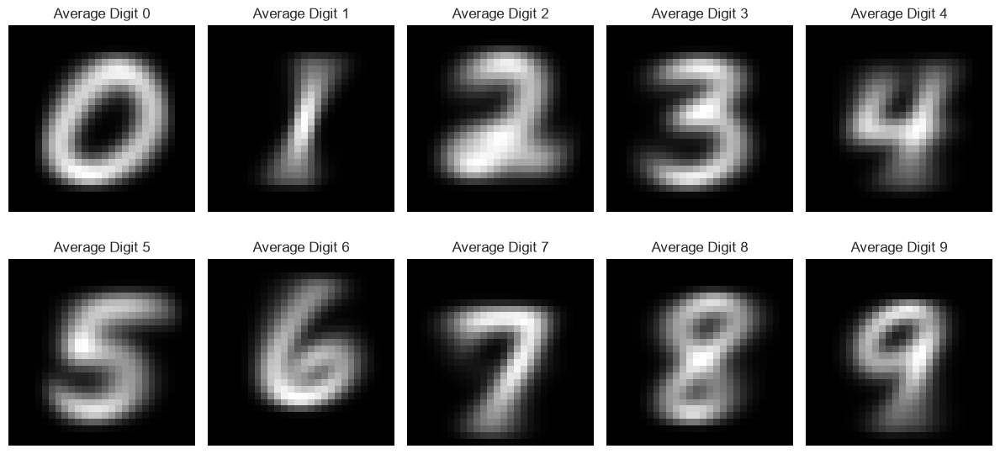

In [312]:
print("\n" + "=" * 60)
print("5. AVERAGE DIGIT IMAGES (Class Prototypes)")
print("=" * 60)

fig, axes = plt.subplots(2, 5, figsize=(12, 6))
for i in range(10):
    ax = axes[i // 5, i % 5]
    if np.sum(y_mnist_array == i) > 0:
        avg_image = X_mnist_array[y_mnist_array == i].mean(axis=0).reshape(28, 28)
        ax.imshow(avg_image, cmap="gray")
        ax.set_title(f"Average Digit {i}")
    else:
        ax.set_title(f"Digit {i} (no data)")
    ax.axis("off")
plt.tight_layout()
plt.show()


6. VARIANCE IMAGES (Where digits vary most)


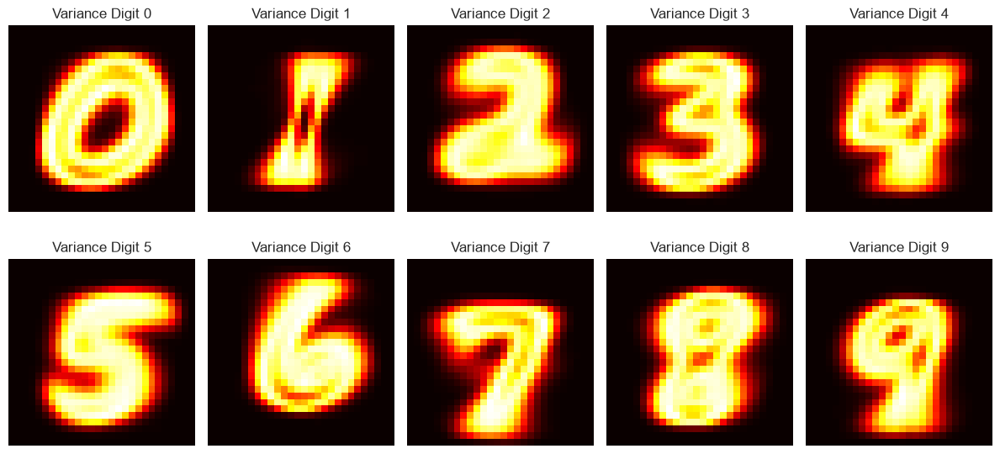

In [313]:
print("\n" + "=" * 60)
print("6. VARIANCE IMAGES (Where digits vary most)")
print("=" * 60)

fig, axes = plt.subplots(2, 5, figsize=(12, 6))
for i in range(10):
    ax = axes[i // 5, i % 5]
    if np.sum(y_mnist_array == i) > 0:
        var_image = X_mnist_array[y_mnist_array == i].var(axis=0).reshape(28, 28)
        ax.imshow(var_image, cmap="hot")
        ax.set_title(f"Variance Digit {i}")
    else:
        ax.set_title(f"Digit {i} (no data)")
    ax.axis("off")
plt.tight_layout()
plt.show()


MNIST - DIMENSIONALITY REDUCTION (Sampled)
Sampled 1000 rows from 70000 total rows
PCA: Explained variance = 11.37% (6.59%, 4.78%)
t-SNE: Applied successfully


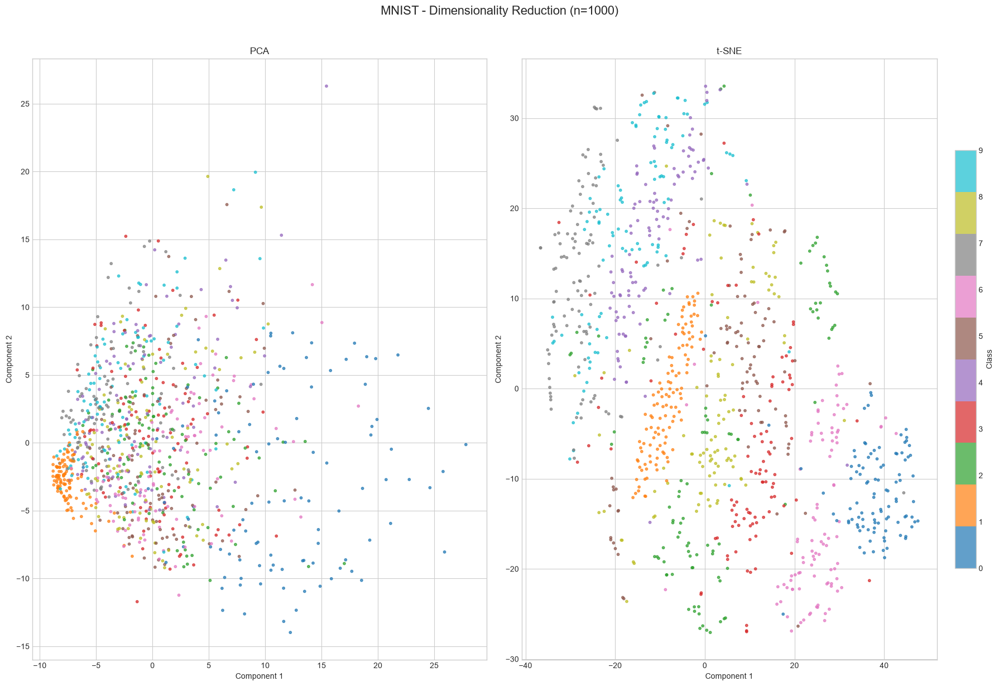

In [314]:
# ============================================================================
# Example 3: MNIST (with sampling)
# ============================================================================
print("\n" + "=" * 60)
print("MNIST - DIMENSIONALITY REDUCTION (Sampled)")
print("=" * 60)

# Sample MNIST for performance
mnist_sample_size = 1000
X_mnist_sample, _, y_mnist_sample, _ = train_test_split(
    X_mnist, y_mnist, train_size=mnist_sample_size, stratify=y_mnist, random_state=42
)

print(f"Sampled {mnist_sample_size} rows from {X_mnist.shape[0]} total rows")

# MNIST
reducer_mnist = DimensionalityReducer(n_components=2, random_state=42)
reducer_mnist.fit_transform(X_mnist_sample, y_mnist_sample, methods=["PCA", "t-SNE"])
reducer_mnist.plot_results(
    y_mnist_sample,
    title_prefix=f"MNIST - Dimensionality Reduction (n={mnist_sample_size})",
    figsize=(18, 12),
    n_cols=2,
    cmap="tab10",
)


9. PIXEL ACTIVATION HEATMAPS (Spatial Distribution)


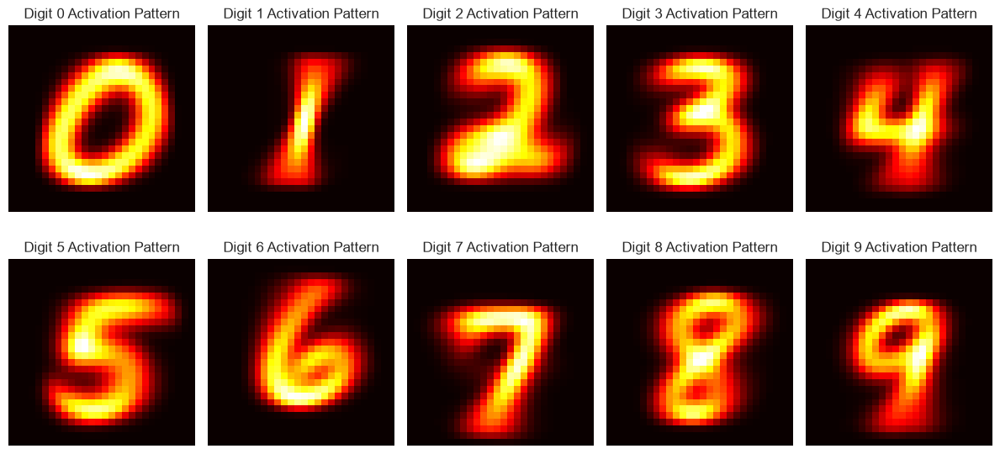

In [315]:
# ============================================================================
print("\n" + "=" * 60)
print("9. PIXEL ACTIVATION HEATMAPS (Spatial Distribution)")
print("=" * 60)

# Show where pixels are most active for each digit (thresholded at mean)
fig, axes = plt.subplots(2, 5, figsize=(12, 6))
for i in range(10):
    ax = axes[i // 5, i % 5]
    if np.sum(y_mnist_array == i) > 0:
        class_data = X_mnist_array[y_mnist_array == i]
        threshold = class_data.mean(axis=0)
        heatmap = threshold.reshape(28, 28)
        ax.imshow(heatmap, cmap="hot")
        ax.set_title(f"Digit {i} Activation Pattern")
    else:
        ax.set_title(f"Digit {i} (no data)")
    ax.axis("off")
plt.tight_layout()
plt.show()


10. OUTLIER DETECTION (Using distance from class mean)


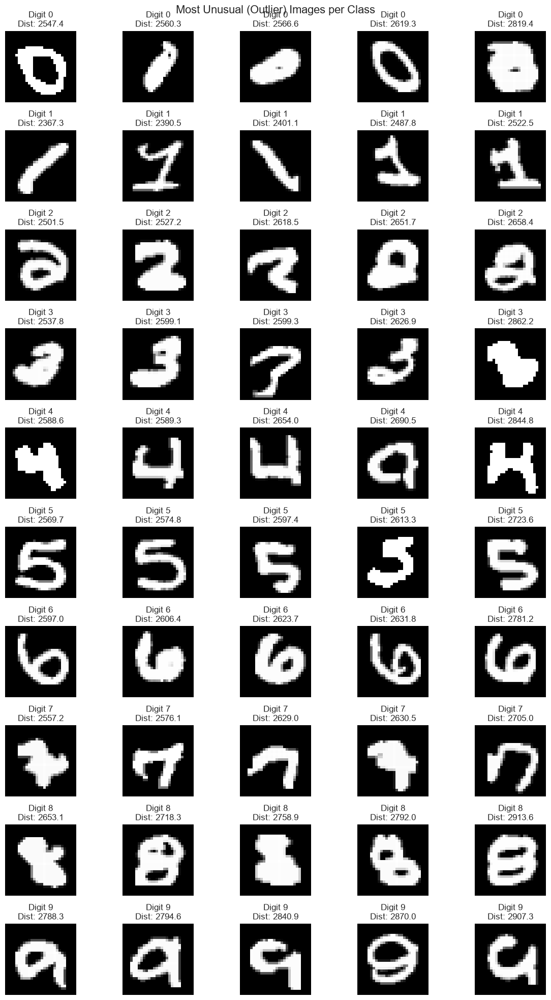

In [316]:
# ============================================================================
print("\n" + "=" * 60)
print("10. OUTLIER DETECTION (Using distance from class mean)")
print("=" * 60)


# Find the most "unusual" images per class using Euclidean distance

fig, axes = plt.subplots(10, 5, figsize=(12, 20))
for i in range(10):
    class_images = X_mnist_array[y_mnist_array == i]
    if len(class_images) > 0:
        outlier_idx, distances = find_outliers(class_images, 5)
        for j, idx in enumerate(outlier_idx):
            ax = axes[i, j]
            ax.imshow(class_images[idx].reshape(28, 28), cmap="gray")
            ax.set_title(f"Digit {i}\nDist: {distances[j]:.1f}")
            ax.axis("off")
        # Hide empty subplots if fewer than 5 outliers
        for j in range(len(outlier_idx), 5):
            axes[i, j].axis("off")
    else:
        for j in range(5):
            axes[i, j].axis("off")

plt.suptitle("Most Unusual (Outlier) Images per Class", fontsize=16)
plt.tight_layout()
plt.show()

In [317]:
# ============================================================================
print("\n" + "=" * 60)
print("11. IMAGE STATISTICS SUMMARY")
print("=" * 60)

stats_df_mnist = pd.DataFrame(
    {
        "Class": range(10),
        "Count": [np.sum(y_mnist_array == i) for i in range(10)],
        "Mean_Intensity": [
            X_mnist_array[y_mnist_array == i].mean()
            if np.sum(y_mnist_array == i) > 0
            else 0
            for i in range(10)
        ],
        "Std_Intensity": [
            X_mnist_array[y_mnist_array == i].std()
            if np.sum(y_mnist_array == i) > 0
            else 0
            for i in range(10)
        ],
        "Min_Intensity": [
            X_mnist_array[y_mnist_array == i].min()
            if np.sum(y_mnist_array == i) > 0
            else 0
            for i in range(10)
        ],
        "Max_Intensity": [
            X_mnist_array[y_mnist_array == i].max()
            if np.sum(y_mnist_array == i) > 0
            else 0
            for i in range(10)
        ],
        "Sparsity_%": [
            (X_mnist_array[y_mnist_array == i] < 10).mean() * 100
            if np.sum(y_mnist_array == i) > 0
            else 0
            for i in range(10)
        ],
    }
)

print(stats_df_mnist.to_string(index=False))


11. IMAGE STATISTICS SUMMARY
 Class  Count  Mean_Intensity  Std_Intensity  Min_Intensity  Max_Intensity  Sparsity_%
     0   6903       44.177405      88.643286              0            255   76.296482
     1   7877       19.406802      62.347559              0            255   89.352283
     2   6990       38.034208      83.171552              0            255   79.182141
     3   7141       36.154209      81.154922              0            255   79.908133
     4   6824       30.996000      75.925956              0            255   82.560407
     5   6313       32.950159      77.565749              0            255   81.262365
     6   6876       35.234865      80.541918              0            255   80.612839
     7   7293       29.217987      74.404598              0            255   83.808716
     8   6825       38.397901      83.059082              0            255   78.702157
     9   6958       31.359408      76.280703              0            255   82.404815



12. LABEL DISTRIBUTION & POTENTIAL ERRORS


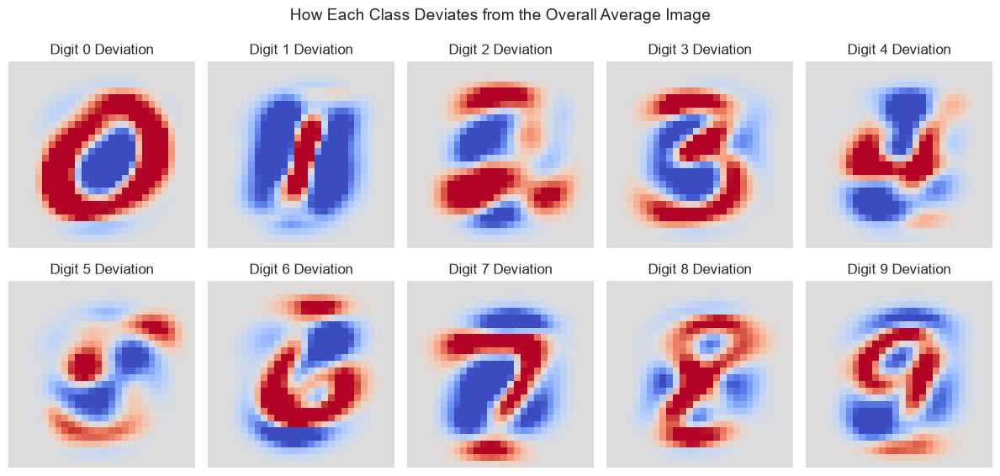

In [318]:
# ============================================================================
print("\n" + "=" * 60)
print("12. LABEL DISTRIBUTION & POTENTIAL ERRORS")
print("=" * 60)

overall_mean = X_mnist_array.mean(axis=0)
fig, axes = plt.subplots(2, 5, figsize=(12, 6))
for i in range(10):
    ax = axes[i // 5, i % 5]
    if np.sum(y_mnist_array == i) > 0:
        class_mean = X_mnist_array[y_mnist_array == i].mean(axis=0)
        diff = class_mean - overall_mean
        ax.imshow(diff.reshape(28, 28), cmap="coolwarm", vmin=-50, vmax=50)
        ax.set_title(f"Digit {i} Deviation")
    else:
        ax.set_title(f"Digit {i} (no data)")
    ax.axis("off")
plt.suptitle("How Each Class Deviates from the Overall Average Image", fontsize=14)
plt.tight_layout()
plt.show()

In [319]:
# ============================================================================
print("\n" + "=" * 60)
print("EDA COMPLETE! Summary of key findings:")
print("=" * 60)
print(f"- Total samples: {X_mnist.shape[0]}")
print("- Pixel values range from 0 to 255")
print(f"- Data type: {X_mnist_array.dtype} (memory optimized)")

# safety check
if "class_stds" in locals() and len(class_stds) > 0 and np.sum(class_stds) > 0:
    print(f"- Most complex digits (highest variance): {np.argmax(class_stds)}")
    print(f"- Simplest digits (lowest variance): {np.argmin(class_stds)}")
    print(f"- Class with highest average intensity: {np.argmax(class_means)}")
    print(f"- Class with lowest average intensity: {np.argmin(class_means)}")
else:
    print("- Class statistics not available")


EDA COMPLETE! Summary of key findings:
- Total samples: 70000
- Pixel values range from 0 to 255
- Data type: uint8 (memory optimized)
- Most complex digits (highest variance): 0
- Simplest digits (lowest variance): 1
- Class with highest average intensity: 0
- Class with lowest average intensity: 1


In [320]:
print_dataset_summary(
    X_bc,
    X_adult,
    X_cover,
    X_mnist,
    y_bc,
    y_adult,
    y_cover,
    y_mnist,
    df_bc,
    df_adult,
    df_cover,
    df_mnist,
)


DATASET SUMMARY
      Dataset  Samples  Features  Classes  Memory (MB)
Breast Cancer      569        30        2     0.135118
 Adult Income    48842         6        2     3.202830
    Covertype   581012        10        7    49.314564
        MNIST    70000       784       10    52.938461


In [321]:
t2 = perf_counter()

elapsed_time = t2 - t1

print(f"the notebook took {elapsed_time:.6f} seconds to run")

the notebook took 203.540911 seconds to run
